## Prepare

In [1]:
import optuna
from optuna.trial import TrialState
import os
import pandas as pd
pd.options.mode.chained_assignment = None # avoids assignment warning
import numpy as np
import random
from glob import glob
from tqdm import tqdm
tqdm.pandas()  # enable progress bars in pandas operations
import gc
import cv2
import librosa
import sklearn
import json
import argparse
import seaborn as sns
import soundfile as sf
# Import for visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
import librosa.display as lid
import IPython.display as ipd
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_param_importances
# from kaggle_datasets import KaggleDatasets

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import transformers
from transformers import ASTConfig
from transformers import AutoFeatureExtractor
from torchvision import transforms
from torch.cuda.amp import autocast as autocast, GradScaler
from torch.optim import SGD, Adam, AdamW
from torch.optim.lr_scheduler import LambdaLR
import torch.nn.functional as F
from transformers.optimization import get_cosine_schedule_with_warmup
from sklearn.model_selection import StratifiedKFold

from optuna_utils.config import CFG
from optuna_utils.dataset import filter_data, upsample_data
# from optuna_utils.dataset import AudioDataset, ASTDataset, DataLoaderX, MusicnnDataset
from optuna_utils.dataset_pytorch import AudioDataset, ASTDataset, DataLoaderX, MusicnnDataset
from optuna_utils.models import BirdModel, ASTagModel, Musicnn, Efficient
from transformers import set_seed
from transformers import AutoConfig

/home/plathzheng/miniconda3/envs/tutorial/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2023-04-20 11:16:08.816268: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-04-20 11:16:08.846876: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-20 11:16:09.425341: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning:

In [2]:
parser = argparse.ArgumentParser(description='PyTorch Kaggle Bird Implementation')
parser.add_argument('--batch_size', type=int, default=10, metavar='N',
                    help='input batch size for training (default: 64)')
parser.add_argument('--lr', type=float, default=0.00001, metavar='LR',
                    help='learning rate (default: 0.0002)')
parser.add_argument('--max_epoch', type=int, default=25, metavar='N',
                    help='how many epochs')
parser.add_argument('--experiment_name', type=str, default='efficient_visual',
                    help='experiment name')
parser.add_argument('--n_trials', type=int, default=20,
                    help='number of trials')
parser.add_argument('--best_acc', type=float, default=0,
                    help='number of trials')
parser.add_argument('--model_name', type=str, default='efficient', choices=['beats', 'ast', 'musicnn', 'efficient'])
parser.add_argument('--eval_step', type=int, default=1)
parser.add_argument('--debug', action='store_true')
parser.add_argument('--model_path', type=str, default='experiments/ast/trial_0/ast.pth')
parser.add_argument('--fold', type=int, default=2)
args = parser.parse_args(['--best_acc', '0'])

In [3]:
set_seed(CFG.seed)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu') 

In [4]:
def main(args, df):
    if args.model_name=='beats':
        dataset_train = AudioDataset(df, fold=args.fold, mode='train')
        # loader_train = DataLoader(dataset_train, batch_size=args.batch_size, shuffle=True, num_workers=0 if CFG.debug else 10)
        loader_train = DataLoaderX(dataset_train, batch_size=args.batch_size, shuffle=True, num_workers=0 if CFG.debug else 10)
        dataset_eval = AudioDataset(df, fold=args.fold, mode='eval')
        # loader_eval = DataLoader(dataset_eval, batch_size=args.batch_size, shuffle=False, num_workers=0 if CFG.debug else 10)
        loader_eval = DataLoaderX(dataset_eval, batch_size=args.batch_size, shuffle=False, num_workers=0 if CFG.debug else 10)
        model = BirdModel(args)
        
    elif args.model_name=='ast':
        dataset_train = ASTDataset(df, fold=args.fold, mode='train')
        loader_train = DataLoader(dataset_train, batch_size=CFG.batch_size, shuffle=True, num_workers=0 if CFG.debug else 10)
        dataset_eval = ASTDataset(df, fold=args.fold, mode='eval')
        loader_eval = DataLoader(dataset_eval, batch_size=CFG.batch_size, shuffle=False, num_workers=0 if CFG.debug else 10)

        config = AutoConfig.from_pretrained("MIT/ast-finetuned-audioset-10-10-0.4593")  
        model = ASTagModel.from_pretrained(
            "MIT/ast-finetuned-audioset-10-10-0.4593",
            config=config,
            train_config=args
        )
        
    elif args.model_name=='musicnn':
        dataset_train = MusicnnDataset(df, fold=args.fold, mode='train')
        loader_train = DataLoaderX(dataset_train, batch_size=args.batch_size, shuffle=True, num_workers=0 if CFG.debug else 10)
        dataset_eval = MusicnnDataset(df, fold=args.fold, mode='eval')
        loader_eval = DataLoaderX(dataset_eval, batch_size=args.batch_size, shuffle=False, num_workers=0 if CFG.debug else 10)
        model = Musicnn(args)
        
    elif args.model_name=='efficient':
        dataset_train = MusicnnDataset(df, fold=args.fold, mode='train')
        loader_train = DataLoaderX(dataset_train, batch_size=args.batch_size, shuffle=True, num_workers=0 if CFG.debug else 10)
        dataset_eval = MusicnnDataset(df, fold=args.fold, mode='eval')
        loader_eval = DataLoaderX(dataset_eval, batch_size=args.batch_size, shuffle=False, num_workers=0 if CFG.debug else 10)
        model = Efficient(args)
    else:
        raise ValueError('The model type - {} has not been implemented'.format(args.model_name))
    
    model = model.to(device)
    total_samples = dataset_train.__len__()
    num_warmup_steps = (total_samples // args.batch_size) * 2
    num_total_steps = (total_samples // args.batch_size) * args.max_epoch
    lr_scheduler = get_cosine_schedule_with_warmup(model.optimizer, num_warmup_steps=num_warmup_steps, num_training_steps=num_total_steps)

    best_metric = 0
    for epoch in tqdm(range(args.max_epoch)):
        model.train_step(loader_train, lr_scheduler)
        best_metric = model.eval_step(args, loader_eval, best_metric, epoch, model_name='{}.pth'.format(args.model_name))
    return best_metric

In [5]:
GCS_PATH = CFG.base_path
df = pd.read_csv(f'{CFG.base_path}/train_metadata.csv')
df['filepath'] = GCS_PATH + '/train_audio/' + df.filename
df['target'] = df.primary_label.map(CFG.name2label)

f_df = filter_data(df, thr=5)
# f_df.cv.value_counts().plot.bar(legend=True)
up_df = upsample_data(df, thr=50)

CFG.class_weights = up_df.primary_label.value_counts()[:].to_numpy()

# Initialize the StratifiedKFold object with 5 splits and shuffle the data
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=CFG.seed)

# Reset the index of the dataframe
df = df.reset_index(drop=True)

# Create a new column in the dataframe to store the fold number for each row
df["fold"] = -1

# Iterate over the folds and assign the corresponding fold number to each row in the dataframe
for fold, (train_idx, val_idx) in enumerate(skf.split(df, df['primary_label'])):
    df.loc[val_idx, 'fold'] = fold

/home/plathzheng/miniconda3/envs/tutorial/lib/python3.8/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


## Data Analyze and Visualization

### Utility

In [7]:
def load_audio(filepath):
    audio, sr = librosa.load(filepath)
    return audio, sr

def show_image(filename):
    img = cv2.imread(f'/kaggle/input/birdclef23-image-dataset/{filename}.jpg')
    img = img[...,::-1] # bgr => rgb
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis('OFF')
    plt.show()
    return img

def get_spectrogram(audio):
    spec = librosa.feature.melspectrogram(y=audio, sr=CFG.sample_rate, 
                                   n_mels=CFG.img_size[0],
                                   n_fft=CFG.nfft,
                                   hop_length=CFG.hop_length,
                                   fmax=CFG.fmax,
                                   fmin=CFG.fmin,
                                   )
    spec = librosa.power_to_db(spec, ref=np.max)
    return spec

def display_audio(row):
    # Caption for viz
    caption = f'Id: {row.filename} | Name: {row.common_name} | Sci.Name: {row.scientific_name} | Rating: {row.rating}'
    # Read audio file
    audio, sr = load_audio(row.filepath)
    # Keep fixed length audio
    audio = audio[:CFG.audio_len]
    # Spectrogram from audio
    spec = get_spectrogram(audio)
    # Display audio
    print("# Audio:")
    display(ipd.Audio(audio, rate=CFG.sample_rate))
    # print("# Image:")
    show_image(row.common_name)
    print('# Visualization:')
    fig, ax = plt.subplots(2, 1, figsize=(12, 2*3), sharex=True, tight_layout=True)
    fig.suptitle(caption)
    # Waveplot
    lid.waveshow(audio,
                 sr=CFG.sample_rate,
                 ax=ax[0])
    # Specplot
    lid.specshow(spec, 
                 sr = CFG.sample_rate, 
                 hop_length = CFG.hop_length,
                 n_fft=CFG.nfft,
                 fmin=CFG.fmin,
                 fmax=CFG.fmax,
                 x_axis = 'time', 
                 y_axis = 'mel',
                 cmap = 'coolwarm',
                 ax=ax[1])
    ax[0].set_xlabel('')
    fig.show()

### Check

We see initially that the three classes with the highest number of categories are 'barswa', 'wlwwar', 'thrnig1',, and the three classes with the lowest number are 'whhsaw1', 'afpkin1', 'crefra2'.

We also show the original wav figure and the corresponding spectrogram figure

['barswa', 'wlwwar', 'thrnig1', 'whhsaw1', 'afpkin1', 'crefra2']
# Category: barswa
# Num Samples: 500
# Audio:


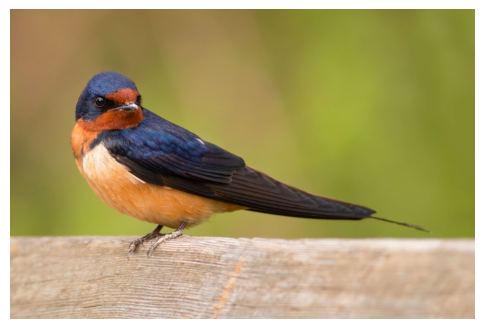

# Visualization:


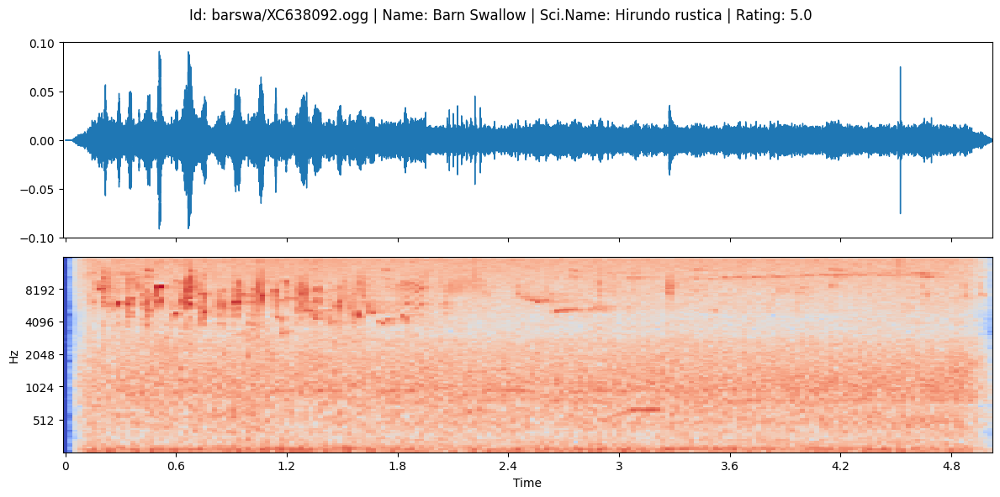

In [8]:
stat = df.primary_label.value_counts().index.tolist()
class_names = stat[:3] + stat[-3:] # popular + not popular
print(class_names)

class_name = class_names[0]
print(f'# Category: {class_name}')
class_df = df.query("primary_label==@class_name")
print(f'# Num Samples: {len(class_df)}')
row = class_df.sample(1).squeeze()

# Display audio
display_audio(row)

### The overview of all data

In [9]:
data = pd.read_csv("/kaggle/input/birdclef-2023/train_metadata.csv",engine='python')
data.head()

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
0,abethr1,[],['song'],4.3906,38.2788,Turdus tephronotus,African Bare-eyed Thrush,Rolf A. de By,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/128013,abethr1/XC128013.ogg
1,abethr1,[],['call'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363501,abethr1/XC363501.ogg
2,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363502,abethr1/XC363502.ogg
3,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/363503,abethr1/XC363503.ogg
4,abethr1,[],"['call', 'song']",-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,4.5,https://www.xeno-canto.org/363504,abethr1/XC363504.ogg


In [41]:
print(df.primary_label.value_counts()[:])

barswa     500
wlwwar     500
thrnig1    500
eaywag1    500
comsan     500
          ... 
lotcor1      1
whctur2      1
whhsaw1      1
afpkin1      1
crefra2      1
Name: primary_label, Length: 264, dtype: int64


We can see, the number of categories is 264. In the same category, the largest sample size is 500, the smallest sample size is only 1. Therefore, there exits the Long Tail Problem.

<AxesSubplot: >

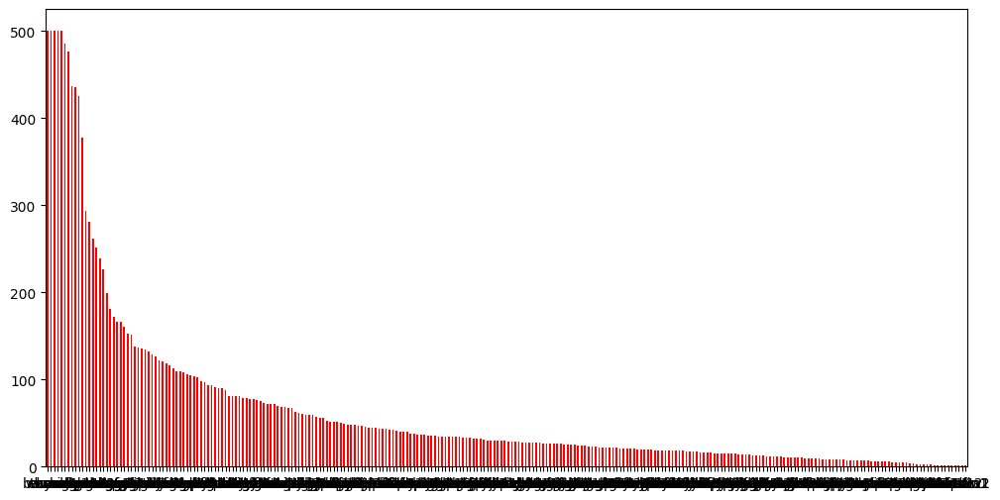

In [38]:
fig, ax = plt.subplots(1, 1, figsize=(12, 6))
ax.set_xticks([])
df.primary_label.value_counts()[:].plot.bar(color='red', label='w/o upsample')

In [39]:
datagroup = df.groupby("primary_label").count()
datagroup

,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename,filepath,target,cv,fold
primary_label,,,,,,,,,,,,,,,
abethr1,15,15,14,14,15,15,15,15,15,15,15,15,15,15,15
abhori1,126,126,126,126,126,126,126,126,126,126,126,126,126,126,126
abythr1,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28
afbfly1,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18
afdfly1,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
yertin1,134,134,133,133,134,134,134,134,134,134,134,134,134,134,134
yesbar1,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29
yespet1,15,15,15,15,15,15,15,15,15,15,15,15,15,15,15


### Visualization
##### Outline
- Bird Distribution
- Visualization of duration time 
- Visualization of average Mfccs
- Visualization of average Amplitude 

##### Analysis
Here, we used a violin plot to visualize the data distribution of each species, because there are 264 categories in total and one plot cannot put down all of them, so we divided the plot into 7 subplots so that the data can be viewed a little more clearly. The violin plot is a good representation of the density, frequency, median, and quantile of each array. Firstly, we visualize the distribution of species on the world mentioned in the dataset. Obviously, the distribution of each species is different and there exists data unbalance in the dataset, which means we need to be careful when train the classifiers. Secondly, we visualize the duration of each species. As you can see from the graph, the distribution of categories in this dataset is not quite balanced, in line with our visualization of category distribution in the previous section, where some categories have a larger number of violins and some categories have a smaller number of violins and a smaller area. However, from the figure, the distribution of duration of each category is relatively concentrated in the same location. Thirdly, we visualize the average mfcc of each species. The figures tell that the distribution of average mfcc is signicantly different. So we use the mfccs feature to do the classification using traditional classifiers. Lstly, we visualize the average amplitude distribution of each species. The figures tell that the average amplitude vary little. In the amplitude distribution chart, the median for all species is around 0.03,0.02.

In summary, there are two information we need to pay attention to. Firstly, the unbalance in the dataset. Secondly, the Mccfs features contain more informative information about species compared to duration and amplitude.

#### Bird Distribution

In [34]:
latitude = df.latitude.values
longitude = df.longitude.values
cate = df.primary_label.values

cate = np.array(cate)
cate = cate[np.isfinite(latitude)]

latitude = np.array(latitude)
latitude = latitude[np.isfinite(latitude)]

longitude = np.array(longitude)
longitude = longitude[np.isfinite(longitude)]

print(latitude.mean(), latitude.std())
print(longitude.mean(), longitude.std())

12.599897051692794 29.207380501753587
22.03568991172192 28.742522386815295


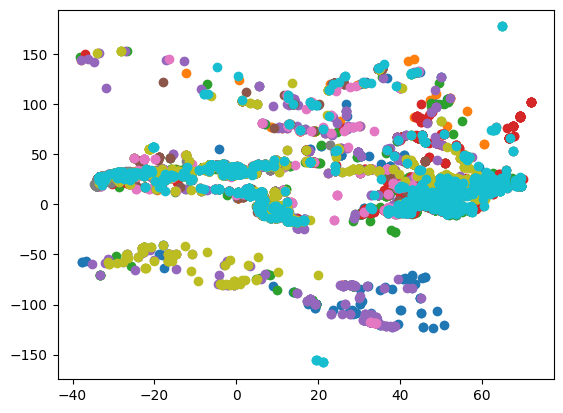

In [37]:
categories = np.unique(cate)
data = np.random.randn(len(categories), 2)

# 生成颜色列表
colors = plt.cm.tab10(np.linspace(0, 1, len(categories)))

for i, category in enumerate(categories):
    lon = longitude[cate==category]
    lat = latitude[cate==category]
    plt.scatter(lat, lon, c=colors[i].reshape(1, -1), label=category)

We can see the bird distribution based on longitude and latitude. 

#### Visualization of Duration time(seconds) distribution of each species

In [ ]:
datagroup = data.groupby("primary_label").count()
sum_ = datagroup['secondary_labels'].sum()
distri = datagroup['secondary_labels']/float(sum_)
class_labels = list(datagroup.index)

In [ ]:
def getduration(i): 
    """
    display waveform of a given speech sample
    :param sample_name: speech sample name
    :param fs: sample frequency
    :return:
    """
    file_prefix = "/home/yangya/桌面/project/train_audio/"
    idx = i
    sample = data.iloc[idx]
    path = file_prefix + sample["filename"]
    samples, sr = librosa.load(path, sr=16000)
    # samples = samples[6000:16000]
    avg_amp =librosa.get_duration(y=samples,sr=sr)
    return avg_amp

In [ ]:
data_avg1 = {}
for i in range(len(class_labels)):
    data_avg1[class_labels[i]] = []
for i in range(len(data)):
    temp = getduration(i)
    label = data['primary_label'][i]
    data_avg1[label].append(temp)

In [ ]:
df1_1=[]
for i in range(len(class_labels)):
    df1_1.append(data_avg1[class_labels[i]])
print(len(class_labels))
print(len(df1_1))
df1_2=df1_1[:40]
df1_3=df1_1[41:80]
df1_4=df1_1[81:120]
df1_5=df1_1[121:160]
df1_6=df1_1[161:220]
df1_7=df1_1[221:264]

In [ ]:
#m = [2,3,4,5,6,7,8,9]
_, ax = plt.subplots(figsize=(100,10))
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df1_2)

In [ ]:
#m = [2,3,4,5,6,7,8,9]
_, ax = plt.subplots(figsize=(100,10))
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df1_3)

In [ ]:
#m = [2,3,4,5,6,7,8,9]
_, ax = plt.subplots(figsize=(100,10))
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df1_4)

In [ ]:
#m = [2,3,4,5,6,7,8,9]
_, ax = plt.subplots(figsize=(100,10))
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df1_5)

In [ ]:
#m = [2,3,4,5,6,7,8,9]
_, ax = plt.subplots(figsize=(100,10))
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df1_6)

In [ ]:
#m = [2,3,4,5,6,7,8,9]
_, ax = plt.subplots(figsize=(100,10))
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df1_7)

#### Visualization of average mfccs distribution of each species

In [ ]:
def get_mean_mfcc(i):
    file_prefix = "/home/yangya/桌面/project/train_audio/"
    idx = i
    sample = data.iloc[idx]
    path = file_prefix + sample["filename"]
    y, sr = librosa.load(path)

# 计算 MFCC 特征
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    return (mfccs.mean())

In [ ]:
data_avg2 = {}
for i in range(len(class_labels)):
    data_avg2[class_labels[i]] = []
for i in range(len(data)):
    temp = get_mean_mfcc(i)
    label = data['primary_label'][i]
    data_avg2[label].append(temp)

In [ ]:
df2_1=[]
for i in range(len(class_labels)):
    df2_1.append(data_avg2[class_labels[i]])

In [ ]:
df2_2=df2_1[:40]
df2_3=df2_1[41:80]
df2_4=df2_1[81:120]
df2_5=df2_1[121:160]
df2_6=df2_1[161:220]
df2_7=df2_1[221:264]

In [ ]:
#m = [2,3,4,5,6,7,8,9]
_, ax = plt.subplots(figsize=(100,10))
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df2_2)

In [ ]:
#m = [2,3,4,5,6,7,8,9]
_, ax = plt.subplots(figsize=(100,10))
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df2_3)

In [ ]:
#m = [2,3,4,5,6,7,8,9]
_, ax = plt.subplots(figsize=(100,10))
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df2_4)

In [ ]:
#m = [2,3,4,5,6,7,8,9]
_, ax = plt.subplots(figsize=(100,10))
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df2_5)

In [ ]:
#m = [2,3,4,5,6,7,8,9]
_, ax = plt.subplots(figsize=(100,10))
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df2_6)

In [ ]:
#m = [2,3,4,5,6,7,8,9]
_, ax = plt.subplots(figsize=(100,10))
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df2_7)

#### Visualization of average Amplitude distribution of each species

In [ ]:
def dcalavgamplitude(i): 
    """
    display waveform of a given speech sample
    :param sample_name: speech sample name
    :param fs: sample frequency
    :return:
    """
    file_prefix = "/home/yangya/桌面/project/train_audio/"
    idx = i
    sample = data.iloc[idx]
    path = file_prefix + sample["filename"]
    samples, sr = librosa.load(path, sr=16000)
    # samples = samples[6000:16000]
    avg_amp =abs(samples).mean()
    return avg_amp
    # 
    # print(len(samples), sr)
    # time = np.arange(0, len(samples)) * (1.0 / sr)
    # plt.plot(time, samples)
    # plt.title("time v.s. amplitude")
    # plt.xlabel("time(s)")
    # plt.ylabel("Amplitude")
    # # plt.savefig("your dir\语音信号时域波形图", dpi=600)
    # plt.show()
    # 

In [ ]:
data_avg = {}
for i in range(len(class_labels)):
    data_avg[class_labels[i]] = []
for i in range(len(data)):
    temp = dcalavgamplitude(i)
    label = data['primary_label'][i]
    data_avg[label].append(temp)


In [ ]:
#data_1 = {'labels':all_class_labels,'amplitude':mean_avg}

#df_1 = pd.DataFrame(data_avg)
df_1=[]
for i in range(len(class_labels)):
    df_1.append(data_avg[class_labels[i]])

In [ ]:

print(len(class_labels))
print(len(df_1))
df_2=df_1[:40]
df_3=df_1[41:80]
df_4=df_1[81:120]
df_5=df_1[121:160]
df_6=df_1[161:220]
df_7=df_1[221:264]

In [ ]:
#m = [2,3,4,5,6,7,8,9]
_, ax = plt.subplots(figsize=(100,10))
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df_2)

In [ ]:
#m = [2,3,4,5,6,7,8,9]
_, ax = plt.subplots(figsize=(100,10))
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df_3)

In [ ]:
#m = [2,3,4,5,6,7,8,9]
_, ax = plt.subplots(figsize=(100,10))
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df_4)

In [ ]:
#m = [2,3,4,5,6,7,8,9]
_, ax = plt.subplots(figsize=(100,10))
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df_5)

In [ ]:
#m = [2,3,4,5,6,7,8,9]
_, ax = plt.subplots(figsize=(100,10))
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df_6)

In [ ]:
#m = [2,3,4,5,6,7,8,9]
_, ax = plt.subplots(figsize=(100,10))
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df_7)

## Traditional Machine Learning Algorithm

### Outline

#### 1. Features：Mfccs
- Data Preprocessing
- Classifiers
     - **KMeans Clustering**
        - Naive Bayes Multinomial BOW
        - Naive Bayes Multinomial TF-IDF
        - Support Vector Machine (SVM) TF-IDF using linear kernel with cross-validation
        - Support Vector Machine (SVM) TF-IDF using RBF kernel with cross-validation
        - Gradient Boosting TF-IDF with cross-validation
        - Random Forest TF-IDF with cross-validation
        - Logistic Regression TF-IDF with cross-validation
        - Use **PCA** to reduce the feature dimensionality
             - SVM (kernel='rbf')  (features dimensionality reduced by PCA)
     - **MeanShitft Clustering**
        - SVM(kernel='rbf')
        - Use **PCA** to reduce the feature dimensionality 
            - SVM (kernel='rbf')  (features dimensionality reduced by PCA)
     - **GMM Clustering**
        - SVM(kernel='rbf')
        - Use **PCA** to reduce the feature dimensionality 
            - SVM (kernel='rbf')  (features dimensionality reduced by PCA)
     - **Spectral Clustering**
        - SVM(kernel='rbf')
        - Use **PCA** to reduce the feature dimensionality 
            - SVM (kernel='rbf')  (features dimensionality reduced by PCA)
#### 2. Features: rms
- Data Preprocessing
- MLP Classifiers
   - MLP (512 - 256 - 64 - 264) with learning-rate = 0.001, momentum =0,min_delta = 0.001 and patience = 5
   - MLP (512 - 256 - 64 - 264) with learning-rate = 0.001 and momentum =0.9 min_delta=0.0001, patience=5
   - MLP (512 - 256 - 64 - 264) with learning-rate = 0.01 and momentum =0.9 min_delta=0.0001, patience=5
   - MLP (512 - 256 - 64 - 264) with learning-rate = 0.1 and momentum =0.9 min_delta=0.0001, patience=5
   - MLP (512 - 256 - 64 - 264) with learning-rate = 0.1, momentum =0.9 and patience = 10  min_delta=0.0001
   - MLP (2000- 1000 - 500 - 264) with learning-rate = 0.1, momentum =0.9 and patience = 10 min_delta=0.0001
   - MLP (2000- 1000 - 800 - 500 - 264) with learning-rate = 0.1, momentum =0.9 and patience = 10 in_delta=0.00001, patience=10
#### 3. Features: rms + location(longtitude+latitude) + author
- Normalize the data
- MLP Classifiers
   - MLP(2000-1000-800-500-264) Momentum = 0.9,min_delta=0.00001, patience=10 learning_rate=0.1 
   - MLP(2000-1000-800-500-264) Momentum = 0.99,min_delta=0.00001, patience=10 learning_rate=0.1
   - MLP(2000-1000-800-500-264) Momentum = 0.9999,min_delta=0.00001, patience=10 learning_rate=0.1
#### 4. Features: zcr + location(longtitude+latitude) + author
- Normalize the data
- MLP Classifiers
   - MLP(2000-1000-800-500-264) mototum = 0.9 learning-rate=0.1 in_delta=0.00001, patience=10
   - MLP(2000-1000-800-500-264) mototum = 0.9 learning-rate=0.5 in_delta=0.00001, patience=10
   - MLP(2000-1000-800-500-264) mototum = 0.9 learning-rate=0.9 in_delta=0.00001, patience=10

### Analysis
#### The first part (**Traditional Machine Learning Classifiers** and **mfccs**)
Firstly, we use panda.read_csv to read the whole data and it returns data with type of Dataframe. And then ,we define a function to convert the audio file into mfccs features by using functions implemented by librosa. After this, we use clustering methods to find the most distinct mfccs features and map the mfccs features of each audio to the index of clustering centers. We use the processed data to do the classification.

Here are the analysis of our traditional machine learning classifier.
In the beginning, we split the whole data into traindata and test data, and use the traindata to train the classifer with cross-validation, then we use the testdata to evaluate the classifier. We create the bag of audios and convert the auido file into the index of audio file in the bag. We get two representations of the audio file, thanks to feature_extraction.text.TfidfTransformer, which are BOW and TF-IDF. BoW just consider the frequency of a 'word' without the importance of a 'word',while the TF-IDF considers both the frequency and importance. We firstly use Naive Bayes Multinomial classfier to classify the species with BOW and TF-IDF respectively, and the features TF-IDF works better. So in the next experiments, we use TF-IDF to do the classification. Though we know when TF-IDF works better with Naive Bayes Multinomial, it does not mean it will works better with other classifiers, we just simplify the problem. So that wo needn't to run so many classifer which just cost my time with no other techniques. 
In the next experiments, we use SVM(kernel = linear), SVM(kernel=rbf), Gradient Boosting , Random Forest and LR with cross-validation to do the classification. Among all the classifer, SVM(kernel=rbf) works best, so we use the classifer to do the classification after we use PCA to reduce the dimensionality of TF-IDF features. We use PCA to reduce the dimensionality after each clustering method. In order to find the if the performance affected by clustering method, we try different clustering method, which includs KMeans, Meanshift, GMM,and Spectral Clustering method. We find that the clustering method has little influence on the performance.BTW，SVM(kernel=rbf）works best when using KMeans and TF-IDF , so when using different clustering method, we use SVM(kernel = rbf) to evaluate the peroformance. However, the performance is ver bad. Additionally, as shown in visualization, there exist class unbalance in the dataset, so we use 'class=balanced' to adjust the weight of different species automatically. 

#### The second part (**MLP** and **rms**)
Results
| MLP Architecture             | Learning-rate | momentum | min_delta | patience | acc      |  
|------------------------------|---------------|----------|-----------|----------|----------|
| 512 - 256 - 64 - 264         | 0.001         | 0        | 0.001     | 5        | 0.020064 |   
| 512 - 256 - 64 - 264         | 0.001         | 0.9      | 0.0001    | 5        | 0.027441 |   
| 512 - 256 - 64 - 264         | 0.01          | 0.9      | 0.0001    | 5        | 0.042195 |   
| 512 - 256 - 64 - 264         | 0.1           | 0.9      | 0.0001    | 5        | 0.052817 |   
| 512 - 256 - 64 - 264         | 0.1           | 0.9      | 0.0001    | 10       | 0.056063 |   
| 2000- 1000 - 500 - 264       | 0.1           | 0.9      | 0.0001    | 10       | 0.047801 |   
| 2000- 1000 - 800 - 500 - 264 | 0.1           | 0.9      | 0.00001   | 10       | 0.046326 |   

Here, we use the MLP classifier and rms features to do the classification. Firstly, we use librosa.feature.rms to extract rms features from original audio files, and the extracted rms features have different dimensionality. However, the MLP classifier just can deal with the data with same dimensionality, therefore, we truncate and pad the rms features to the same dimensionality. But what's the best length each sample should hold? IN order to better make the decision, we visulaize the length distribution of each auido with violin plot, as show in the code. From the figure, it shown that the median of all the audio files in test data and train data(we split the data into train data and test data in the beginning of the second part) is around 750, however, in order to hold as much information of each audio file as possible, we choose the length of 800. It is bigger than 750, which means most of the auido file can contain the full information. There is a gap between  750 and 800, which means there is more possibilty for most audio files to hold the full information of audio. Next, we truncate and pad the data to the length of 800.
Without idea about how many hidden nodes and layers should the MLP classifier we should have, i just simplify follow the same design of tutorial 8 which aims at dealing with images with a little adjustication of input dimension.
As show in the table above, the performance is very very very bad. So i try to tune the hyperparameters, with learning-rate getting bigger, the accuracy has a little improvement. Therefore, i try to adjust the min_delta, as i think the loss function converge earlier that the loss is very high, with smaller the min_delta is, the improvement is negilible. I think it's because the hidden nodes is too small, as the data fit into the MLP classifier has the dimension of 800. When using smaller hidden nodes than the input dimension, the information of features lost. Therefore, i increase the hidden nodes to 2000,1000,500 respectively. HOwever, the performance is low too. In the meanwhile, i increase the patience when training, which could affect the epochs the MLP trains. With the patience bigger, the MLP will run more epochs, so it has more chance to improve the performance, however, the improvement is negiligible.
I try to find what's the problem is, what come to my mind is the MLP is not deep enough(because the deeper the MLP is, the more information it will learn), so I add the layer of the MLP from 4 to 5, but the perforance is bad too. 
It does not work! 
I think is maybe the value of each sample vary lot, so the value affect the convergence a lot. Additionally, the features may not be enough, so i add the location of each sample and the autor information to do the classificatiion in the next part.
#### The third part (**MLP** and **rms + longitude + latitude +author(normalized)**)
Results
| MLP Architecture      | momentum | learning-rate | min_delta | patience | acc      |   
|-----------------------|----------|---------------|-----------|----------|----------|
| 2000-1000-800-500-264 | 0.9      | 0.1           | 0.00001   | 10       | 0.028326 |   
| 2000-1000-800-500-264 | 0.99     | 0.1           | 0.00001   | 10       | 0.028917 |  
| 2000-1000-800-500-264 | 0.9999   | 0.1           | 0.00001   | 10       | 0.024195 | 

Here, we use the same features as the second part, but we normalize the data and add more features.
With the consideration in the second part, we normalize the data first.
In order to use python more convenient, we normalize the data after truncate or pad the rms features, which means the step we adopt may affect the results. In this part, we ignore the affect may caused by that. We use the widder and deeper MLP, because with widder the MLP is, the more information it will learn, and with deeper the MLP is, the more complicate relationship the MLP will learn. Firstly, we adopt momentum equals 0.9, the acc is 0.028326. We want to explore how the momentum will affact the accuracy in this acenario, so we just change the momentum. However, with momentum change from 0.9,to 0.99 and 0.9999 , the performance is bad. What worth noting is that when momentum = 0.99, the loss firslty decrease and the increase. I think it's because the momentum is too big.
We want to know why the performance is still bad, so we use other features in the next part. 
#### The fourth part (**MLP** and **zcr +longitude +latitude +author(normalized)**)
Results
| MLP Architecture      | momentum | min_delta | patience | learning-rate | acc |
|-----------------------|----------|-----------|----------|---------------|-----|
| 2000-1000-800-500-264 | 0.9      | 0.00001   | 10       | 0.1           |  0.028326   |   
|  2000-1000-800-500-264 | 0.9      | 0.00001   | 10       | 0.5           |   0.028917  |   
|  2000-1000-800-500-264 | 0.9      | 0.00001   | 10       | 0.9           |0.029212| 

In thi part, we normalize the data using the same method as the third part. I need to mentiion that the information of author is transformed into one-hot representatiion, as the explanation said that the author might affect the results, and in order to convert the author into representation that computers can understand, we firstly extract the author names present in the dataset, then sort it, and map the author names into the index in the sorted array, and finally get the index of each authors. HOwever, with the representations is numerical numbers, it express more information than we want, for example, the number of 2,3,4 represent three different authors, however, the authors should not have any relationship with each other as stated in the problem, but the gap between 2 and 3 is smaller than the gap between 2 and 4, which means the 2 author are more close to the 3 author. We do not want this happen! So we convert the number into one-hot representation, because it will not bring in more 'extra' information. We do this way in the third part too. Also, we normalize the longitutde and latitude using Maximum and Minimum. We normalize the zcr features using Maximum and Minimum too.
In this part, we use the same structure as the third part, because we want to know how the features affect the classifer. Unlike the second part with just adjusting momentum, in this part, we just adjust the learning-rate. As shown in the table above, the accracy first increase and the decrease. It's because when learning-rate is too big, the gradient update step is too big that it miss the minimum. The loss figure show that the loss first decrease and then increase.


#### Why we choose MFCC, RMS and ZCR?
- MFCC:  MFCC (Mel-Frequency Cepstral Coefficients) is a technique for converting speech signals into frequency-domain coefficients, which is very common in the field of speech recognition and speech processing. It's the most commonly techniques in speech signal processing.
MFCC convert the signal to a low-dimensional domain in frequency, reducing the dimensionality of speech signal. Besides, MFCC can be used to remove noise from audio signals. We found there are some noise in the data, so it's another reason for us to choose MFCC. Additionally, as shown in visualization, the distribution of mfccs vary between different species, which means we might could use the mfccs features to do the classification. However, the results is bad. I think it's because the classifier is not expressive enough, so wo move to DMM models in the next section.
- RMS： RMS (Root Mean Square) is a common index used in audio signal processing and feature extraction to measure the energy of a signal. RMS is a simple feature because it only involves the total energy of the signal and not the specific frequency components. We choose it because it is very simple.
- ZCR: "ZCR" stands for Zero Crossing Rate, which is a feature used to describe the waveform shape of an audio signal. The rate at which the audio signal crosses the zero line during the transition from positive to negative waveform is called the ZCR. Mathematically, ZCR is the ratio of the number of waveform crossings of the zero line to the total number of samples. ZCR is a common feature used in audio feature extraction, and it can be used to detect periodic sounds in an audio signal. Similar to RMS, ZCR is a relatively simple feature that can be used to extract basic information from an audio signal such as the rhythm, prosody, and smoothness of an audio signal.  ZCR can also be combined with other features to improve the accuracy of classification of audio signals.

In order to improve the performance, we consider using DNN models. We will analysis and show it in the next part.


### 1. Features: Mfccs

##### Data preprocessing

In [ ]:
train_df, test_df = train_test_split(data, test_size=0.2, random_state=101)

In [ ]:
#convert ogg file into mfccs
def convert_to_mfccs(data):
    mfccs_res = []
    file_prefix = "/home/yangya/桌面/project/train_audio/"
    for i in range(len(data)):
        idx =i 
        sample = data.iloc[idx]
        path = file_prefix + sample["filename"]
        y, sr = librosa.load(path)
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
        mfccs_res.append(mfccs.T)
    return mfccs_res

In [ ]:
#get the mfccs feature 
train_mfccs = convert_to_mfccs(train_df)
test_mfccs= convert_to_mfccs(test_df)

In [ ]:
# compute delta MFCCs
def compute_delta_mfccs(mfccs):
    dmfccs = []
    for m in mfccs:
        tmp = m[1:] - m[0:-1]
        dm = np.hstack((m[0:-1], tmp))
        dmfccs.append(dm)
    return dmfccs

In [ ]:
#get the compute delta mfccs
train_dmfccs = compute_delta_mfccs(train_mfccs)
test_dmfccs = compute_delta_mfccs(test_mfccs)

In [ ]:
all_dmfccs = np.vstack(train_dmfccs)
print(all_dmfccs.shape)

#### Clustering Method-**KMeans** (Data Preprocessing)

In [ ]:
# run k-means to build codebook
km = cluster.KMeans(n_clusters=100, random_state=4487)
km.fit(all_dmfccs[0::100])  # subsample by 10 to make it faster
km.cluster_centers_

In [ ]:
def bow_transform(model, mfccs):
    numwords = model.cluster_centers_.shape[0]
    bows = np.zeros((len(mfccs), numwords))
    for i in range(len(mfccs)):
        w = model.predict(mfccs[i])
        bw = np.bincount(w, minlength=numwords)
        bows[i,:] = bw
    return bows

In [ ]:
train_bow = bow_transform(km, train_dmfccs)
test_bow = bow_transform(km,test_dmfccs)
tagnames = data["primary_label"].unique()
# convert list of tags into binary class labels
def tags2class(tags, tagnames):
    b = np.zeros(shape=(len(tags), len(tagnames)))
    for i,t in enumerate(tags):
        for j,n in enumerate(tagnames):
            if n in t:
                b[i,j] = 1
    return b

In [ ]:
# train_classes[i,j] = absence/presence of the j-th tag in the i-th sound
train_classes_ = tags2class(train_df['primary_label'], tagnames)
test_classes_ = tags2class(test_df['primary_label'], tagnames)

train_classes = []
for i in range(len(train_classes_)):
    train_classes.append(np.argmax(train_classes_[i]))

test_classes = []
for j in range(len(test_classes_)):
    test_classes.append(np.argmax(test_classes_[j]))

In [ ]:
print(np.array(train_classes).shape)
print(np.array(test_classes).shape)
#print(test_classes_)

In [ ]:
# convert to TF
tf_trans = feature_extraction.text.TfidfTransformer(use_idf=True, norm='l1')
train_Xtf = tf_trans.fit_transform(train_bow)
test_Xtf  = tf_trans.transform(test_bow)


#### Naive Bayes Multinomial BOW with cross-validation

In [ ]:
# Train Multinomial NB model
def trainMModel(a):
    mmodel = naive_bayes.MultinomialNB(alpha = a)
    mmodel.fit(train_bow,train_classes)
    
    testY = test_classes
    predY = mmodel.predict(test_bow)
    acc = metrics.accuracy_score(testY, predY)
    
    return acc

# Grid Search to find the best performance parameter setting (alpha)
def GridSearchMModel(start_a, num_a):
    best_a = start_a
    best_acc = 0.0
    for i in range(0, num_a):
        a = start_a + (i / (num_a - 1))
        tmp_acc = trainMModel(a)
        if tmp_acc > best_acc:
            best_a = a
            best_acc = tmp_acc
    return best_a, best_acc

best_a, best_acc = GridSearchMModel(0.0, 10001)
print("Parameter setting with best performance: alpha = {}, accuracy = {}".format(best_a, best_acc))

#### Naive Bayes Multinomial TF-IDF with cross-validation

In [ ]:
# Train Multinomial NB model
def trainMModel(a):
    mmodel = naive_bayes.MultinomialNB(alpha = a)
    mmodel.fit(train_Xtf,train_classes)
    
    testY = test_classes
    predY = mmodel.predict(test_Xtf)
    acc = metrics.accuracy_score(testY, predY)
    
    return acc

# Grid Search to find the best performance parameter setting (alpha)
def GridSearchMModel(start_a, num_a):
    best_a = start_a
    best_acc = 0.0
    for i in range(0, num_a):
        a = start_a + (i / (num_a - 1))
        tmp_acc = trainMModel(a)
        if tmp_acc > best_acc:
            best_a = a
            best_acc = tmp_acc
    return best_a, best_acc

best_a, best_acc = GridSearchMModel(0.0, 10001)
print("Parameter setting with best performance: alpha = {}, accuracy = {}".format(best_a, best_acc))

#### Suport Vector Machine(SVM,kernel = linear) TF-IDF with cross-validation

In [ ]:
# Using SVM with linear kernel
def trainSVM(c):
    clf = pipeline.Pipeline([('vect', feature_extraction.text.CountVectorizer()), ('tfidf', feature_extraction.text.TfidfTransformer()), ('clf', svm.SVC(C = c, kernel = 'linear'))])
    svm_clf = clf.fit(train_Xtf, train_classes)
    svm_predY = svm_clf.predict(test_Xtf)
    acc_svm = metrics.accuracy_score(test_classes, svm_predY)
    
    return acc_svm

# Grid Search to find the C with best performance
def GridSearchSVM(Cs):
    best_c = Cs[0]
    best_acc = 0.0
    for i in range(len(Cs)):
        tmp_acc = trainSVM(Cs[i])
        if tmp_acc > best_acc:
            best_c = Cs[i]
            best_acc = tmp_acc
    return best_c, best_acc

Cs = np.logspace(-5, 5, 50)
best_c, best_acc_svm = GridSearchSVM(Cs)
print("Parameter setting with best performance: C = {}, accuracy = {}".format(best_c, best_acc_svm))

In [ ]:
paramgrid = {'C': np.logspace(-5, 5, 50)}

print(paramgrid)

# setup the cross-validation object
# pass the SVM object w/ rbf kernel, parameter grid, and number of CV folds
svmcv = model_selection.GridSearchCV(svm.SVC(kernel = 'linear'), paramgrid, cv=5, n_jobs=-1, verbose=True)

# run cross-validation (train for each split)
svmcv.fit(train_Xtf , train_classes);

print("best params:", svmcv.best_params_)
# predict from the model
predY1 = svmcv.best_estimator_.predict(test_Xtf)

# calculate accuracy
acc1 = metrics.accuracy_score(test_classes, predY1)
print("test accuracy =", acc1)


#### Suport Vector Machine(SVM,kernel = rbf) TF-IDF with cross-validation

In [ ]:
# Using SVM with linear kernel
def trainSVMRBF(c):
    clf = pipeline.Pipeline([('vect', feature_extraction.text.CountVectorizer()), ('tfidf', feature_extraction.text.TfidfTransformer()), ('clf', svm.SVC(C = c, kernel = 'rbf'))])
    svm_clf = clf.fit(train_Xtf, train_classes)
    svm_predY = svm_clf.predict(test_Xtf)
    acc_svm = metrics.accuracy_score(test_classes, svm_predY)
    
    return acc_svm

# Grid Search to find the C with best performance
def GridSearchSVMRBF(Cs):
    best_c = Cs[0]
    best_acc = 0.0
    for i in range(len(Cs)):
        tmp_acc = trainSVMRBF(Cs[i])
        if tmp_acc > best_acc:
            best_c = Cs[i]
            best_acc = tmp_acc
    return best_c, best_acc

Cs = np.logspace(-5, 5, 50)
best_c3, best_acc_svm3 = GridSearchSVMRBF(Cs)
print("Parameter setting with best performance: C = {}, accuracy = {}".format(best_c3, best_acc_svm3))

In [ ]:
# setup the list of parameters to try
paramgrid = {'C': np.logspace(-5, 5, 50)}

print(paramgrid)

# setup the cross-validation object
# pass the SVM object w/ rbf kernel, parameter grid, and number of CV folds
svmcv2 = model_selection.GridSearchCV(svm.SVC(kernel = 'rbf'), paramgrid, cv=5, n_jobs=-1, verbose=True)

# run cross-validation (train for each split)
svmcv2.fit(train_Xtf, train_classes)

print("best params:", svmcv2.best_params_)

# predict from the model
predY2 = svmcv2.best_estimator_.predict(test_Xtf)

# calculate accuracy
acc2 = metrics.accuracy_score(test_classes, predY2)
print("test accuracy =", acc2)

#### Gradient Boosting TF-IDF with cross-validation

In [ ]:
import xgboost as xgb
# Gradient Boosting

paramsampler= {    
    "colsample_bytree": stats.uniform(0.7, 0.3),  
    "gamma":            stats.uniform(0, 0.5),    
    "max_depth":        stats.randint(2, 6),      
    "subsample":        stats.uniform(0.6, 0.4),  
    "learning_rate":    stats.uniform(.001,1),    
    "n_estimators":     stats.randint(10, 1000),
}

#X_train, X_test, y_train, y_test = model_selection.train_test_split(trainXtf, trainY, test_size = 0.2, random_state = 0)
xclf = xgb.XGBClassifier(objective = "multi:softmax", random_state = 4487)
xgbcv = model_selection.RandomizedSearchCV(xclf, param_distributions = paramsampler, random_state = 4487, n_iter = 200, cv = 5, verbose = 1, n_jobs = -1)
xgbcv.fit(train_Xtf , train_classes)

print("best params:", xgbcv.best_params_)

In [ ]:
xgb_predY = xgbcv.best_estimator_.predict(test_Xtf)
acc_xgb = metrics.accuracy_score(test_classes, xgb_predY)
print("Gradient Boosting classifier accuracy: {}".format(acc_xgb))

#### Random Forest with cross-validation

In [ ]:
paramsampler = {#'max_features': stats.uniform(0,1.0),
                 'max_depth':         stats.randint(1,5),
                 'min_samples_split': stats.uniform(0,0.5), 
                 'min_samples_leaf':  stats.uniform(0,0.5),
               }

rfrcv = model_selection.RandomizedSearchCV(
                            ensemble.RandomForestClassifier(n_estimators = 100, random_state = 4487, n_jobs = -1),
                            param_distributions = paramsampler, 
                            random_state = 4487, n_iter = 1000, cv = 5, 
                            verbose = 1, n_jobs = -1)

rfrcv.fit(train_Xtf, train_classes);

print("best params:", rfrcv.best_params_)

In [ ]:
rf_predY = rfrcv.best_estimator_.predict(test_Xtf)
acc_rf = metrics.accuracy_score(test_classes, rf_predY)
print("Random Forest classifier accuracy: {}".format(acc_rf))

#### Logistic Regression TF-IDF with cross-validation

In [ ]:
# Using LR
def trainLR(c):
    logreg = pipeline.Pipeline([('vect', feature_extraction.text.CountVectorizer()), ('tfidf', feature_extraction.text.TfidfTransformer()), ('clf', linear_model.LogisticRegression(n_jobs = -1, C = c, solver = 'saga'))])
    lr_clf = logreg.fit(train_Xtf, train_classes)
    lr_predY = lr_clf.predict(test_Xtf)
    acc_lr = metrics.accuracy_score(test_classes, lr_predY)
    
    return acc_lr

# Grid Search to find the C with best performance
def GridSearchLR(Cs):
    best_c = Cs[0]
    best_acc = 0.0
    for i in range(len(Cs)):
        tmp_acc = trainLR(Cs[i])
        if tmp_acc > best_acc:
            best_c = Cs[i]
            best_acc = tmp_acc
    return best_c, best_acc

Cs = logspace(-5, 5, 50)
best_c_lr, best_acc_lr = GridSearchLR(Cs)
print("Parameter setting with best performance: C = {}, accuracy = {}".format(best_c_lr, best_acc_lr))

In [ ]:
Cs = logspace(-5, 5, 50)

# setup the cross-validation object
lrcv_clf = pipeline.Pipeline([('vect', feature_extraction.text.CountVectorizer()), ('tfidf', feature_extraction.text.TfidfTransformer()), ('clf', linear_model.LogisticRegressionCV(n_jobs = -1, Cs = Cs, solver = 'saga', max_iter = 10000))])
lrcv = lrcv_clf.fit(train_Xtf, train_classes)

lr_predY = lrcv.predict(test_Xtf)
acc_lrcv = metrics.accuracy_score(test_classes, lr_predY)

print("Accuracy of LR model with cross-validation: ", acc_lrcv)

#### Use PCA to reduce dimensionality

In [ ]:
pca_model = decomposition.TruncatedSVD(n_components=90)
pca_model.fit(train_Xtf)

In [ ]:
# This function plot the PCA curve
def plot_exp_ratio(ratio, title):
    explain_fig = plt.figure()
    idx = np.where(ratio > 0.95)[0]#[0]
    print("95% ratio when components are {}".format(idx))
    #plt.title(title)
    #plt.plot(ratio)

In [ ]:
#print((np.cumsum(pca_model.explained_variance_ratio_)).shape)
plot_exp_ratio(np.cumsum(pca_model.explained_variance_ratio_), 
               "Explained Variance Ratio(PCA)")

Convert the TF-IDF features to reduced dimensionality features

In [ ]:
pca_500To285 = decomposition.TruncatedSVD(n_components=76)
pca_500To285.fit(train_Xtf)

train_Xtfpca = pca_500To285.transform(train_Xtf)
test_Xtfpca = pca_500To285.transform(test_Xtf)

In [ ]:
print(train_Xtfpca.shape)
print(test_Xtfpca.shape)

#### SVM (kernel = rbf) TF-IDF(dimensionality reduced features) with cross-validation

In [ ]:
# setup the list of parameters to try
paramgrid = {'C': np.logspace(-5, 5, 50)}

print(paramgrid)

# setup the cross-validation object
# pass the SVM object w/ rbf kernel, parameter grid, and number of CV folds
svmcv2 = model_selection.GridSearchCV(svm.SVC(kernel = 'rbf'), paramgrid, cv=5, n_jobs=-1, verbose=True)

# run cross-validation (train for each split)
svmcv2.fit(train_Xtfpca, train_classes)

print("best params:", svmcv2.best_params_)

# predict from the model
predY2 = svmcv2.best_estimator_.predict(test_Xtfpca)

# calculate accuracy
acc2 = metrics.accuracy_score(test_classes, predY2)
print("test accuracy =", acc2)

### Clustering Method-**Mean-shift** (Data Preprocessing)

In [ ]:
# run k-means to build codebook
km = cluster.MeanShift(bandwidth=5, bin_seeding=True, n_jobs=-1)#cluster.KMeans(n_clusters=100, random_state=4487)
km.fit(all_dmfccs[0::100])  # subsample by 10 to make it faster
km.cluster_centers_

In [ ]:
def bow_transform(model, mfccs):
    numwords = model.cluster_centers_.shape[0]
    bows = np.zeros((len(mfccs), numwords))
    for i in range(len(mfccs)):
        w = model.predict(mfccs[i])
        bw = np.bincount(w, minlength=numwords)
        bows[i,:] = bw
    return bows

trainmeanshift_bow = bow_transform(km, train_dmfccs)
testmeanshift_bow = bow_transform(km,test_dmfccs)

In [ ]:
# convert to TF
tf_trans = feature_extraction.text.TfidfTransformer(use_idf=True, norm='l1')
trainmeanshift_Xtf = tf_trans.fit_transform(trainmeanshift_bow )
testmeanshift_Xtf  = tf_trans.transform(testmeanshift_bow)

#### Suport Vector Machine(SVM,kernel = rbf) TF-IDF with cross-validation

In [ ]:
# setup the list of parameters to try
paramgrid = {'C': np.logspace(-5, 5, 50)}

print(paramgrid)

# setup the cross-validation object
# pass the SVM object w/ rbf kernel, parameter grid, and number of CV folds
svmcv2 = model_selection.GridSearchCV(svm.SVC(kernel = 'rbf'), paramgrid, cv=5, n_jobs=-1, verbose=True)

# run cross-validation (train for each split)
svmcv2.fit(trainmeanshift_Xtf , train_classes)

print("best params:", svmcv2.best_params_)

# predict from the model
predY2 = svmcv2.best_estimator_.predict(testmeanshift_Xtf)

# calculate accuracy
acc2 = metrics.accuracy_score(test_classes, predY2)
print("test accuracy =", acc2)

#### Use PCA to reduce dimensionality

In [ ]:

pca_500To285 = decomposition.TruncatedSVD(n_components=50)
pca_500To285.fit(train_Xtf)

train_Xtfpca = pca_500To285.transform(train_Xtf)
test_Xtfpca = pca_500To285.transform(test_Xtf)

#### SVM (kernel = rbf) TF-IDF(dimensionality reduced features) with cross-validation

In [ ]:
# setup the list of parameters to try
paramgrid = {'C': np.logspace(-5, 5, 50)}

print(paramgrid)

# setup the cross-validation object
# pass the SVM object w/ rbf kernel, parameter grid, and number of CV folds
svmcv2 = model_selection.GridSearchCV(svm.SVC(kernel = 'rbf'), paramgrid, cv=5, n_jobs=-1, verbose=True)

# run cross-validation (train for each split)
svmcv2.fit(trainmeanshift_Xtf , train_classes)

print("best params:", svmcv2.best_params_)

# predict from the model
predY2 = svmcv2.best_estimator_.predict(testmeanshift_Xtf)

# calculate accuracy
acc2 = metrics.accuracy_score(test_classes, predY2)
print("test accuracy =", acc2)

### Clustering Method-**GMM** (Data Preprocessing)

In [ ]:
# run k-means to build codebook
km = mixture.GaussianMixture(n_components=100, covariance_type='full', random_state=4487, n_init=10)
km.fit(all_dmfccs[0::100])  # subsample by 10 to make it faster
km.cluster_centers_

In [ ]:
def bow_transform(model, mfccs):
    numwords = model.cluster_centers_.shape[0]
    bows = np.zeros((len(mfccs), numwords))
    for i in range(len(mfccs)):
        w = model.predict(mfccs[i])
        bw = np.bincount(w, minlength=numwords)
        bows[i,:] = bw
    return bows

trainGMM_bow = bow_transform(km, train_dmfccs)
testGMM_bow = bow_transform(km,test_dmfccs)

In [ ]:
# convert to TF
tf_trans = feature_extraction.text.TfidfTransformer(use_idf=True, norm='l1')
trainGMM_Xtf = tf_trans.fit_transform(trainGMM_bow )
testGMM_Xtf  = tf_trans.transform(testGMM_bow)

#### Suport Vector Machine(SVM,kernel = rbf) TF-IDF with cross-validation

In [ ]:
# setup the list of parameters to try
paramgrid = {'C': np.logspace(-5, 5, 50)}

print(paramgrid)

# setup the cross-validation object
# pass the SVM object w/ rbf kernel, parameter grid, and number of CV folds
svmcv2 = model_selection.GridSearchCV(svm.SVC(kernel = 'rbf'), paramgrid, cv=5, n_jobs=-1, verbose=True)

# run cross-validation (train for each split)
svmcv2.fit(trainGMM_Xtf , train_classes)
#### SVM (kernel = rbf) TF-IDF(dimensionality reduced features) with cross-validation
print("best params:", svmcv2.best_params_)

# predict from the model
predY2 = svmcv2.best_estimator_.predict(testGMM_Xtf)

# calculate accuracy
acc2 = metrics.accuracy_score(test_classes, predY2)
print("test accuracy =", acc2)

#### Use PCA to reduce dimensionality

In [ ]:

pca_500To285 = decomposition.TruncatedSVD(n_components=50)
pca_500To285.fit(trainGMM_Xtf)

train_Xtfpca = pca_500To285.transform(trainGMM_Xtf)
test_Xtfpca = pca_500To285.transform(testGMM_Xtf)

#### SVM (kernel = rbf) TF-IDF(dimensionality reduced features) with cross-validation

In [ ]:
# setup the list of parameters to try
paramgrid = {'C': np.logspace(-5, 5, 50)}

print(paramgrid)

# setup the cross-validation object
# pass the SVM object w/ rbf kernel, parameter grid, and number of CV folds
svmcv2 = model_selection.GridSearchCV(svm.SVC(kernel = 'rbf'), paramgrid, cv=5, n_jobs=-1, verbose=True)

# run cross-validation (train for each split)
svmcv2.fit(train_Xtfpca , train_classes)

print("best params:", svmcv2.best_params_)

# predict from the model
predY2 = svmcv2.best_estimator_.predict(test_Xtfpca)

# calculate accuracy
acc2 = metrics.accuracy_score(test_classes, predY2)
print("test accuracy =", acc2)

### Clustering Method-**SpectralCluster** (Data Preprocessing)

In [ ]:
# run k-means to build codebook
km = luster.SpectralClustering(n_clusters=4100, affinity='rbf', gamma=1.0, assign_labels='discretize', n_jobs=-1)
km.fit(all_dmfccs[0::100])  # subsample by 10 to make it faster
km.cluster_centers_

In [ ]:
def bow_transform(model, mfccs):
    numwords = model.cluster_centers_.shape[0]
    bows = np.zeros((len(mfccs), numwords))
    for i in range(len(mfccs)):
        w = model.predict(mfccs[i])
        bw = np.bincount(w, minlength=numwords)
        bows[i,:] = bw
    return bows

trainS_bow = bow_transform(km, train_dmfccs)
testS_bow = bow_transform(km,test_dmfccs)

In [ ]:
# convert to TF
tf_trans = feature_extraction.text.TfidfTransformer(use_idf=True, norm='l1')
trainS_Xtf = tf_trans.fit_transform(trainS_bow )
testS_Xtf  = tf_trans.transform(testS_bow)

#### Suport Vector Machine(SVM,kernel = rbf) TF-IDF with cross-validation

In [ ]:
# setup the list of parameters to try
paramgrid = {'C': np.logspace(-5, 5, 50)}

print(paramgrid)

# setup the cross-validation object
# pass the SVM object w/ rbf kernel, parameter grid, and number of CV folds
svmcv2 = model_selection.GridSearchCV(svm.SVC(kernel = 'rbf'), paramgrid, cv=5, n_jobs=-1, verbose=True)

# run cross-validation (train for each split)
svmcv2.fit(trainS_Xtf , train_classes)

print("best params:", svmcv2.best_params_)

# predict from the model
predY2 = svmcv2.best_estimator_.predict(testS_Xtf)

# calculate accuracy
acc2 = metrics.accuracy_score(test_classes, predY2)
print("test accuracy =", acc2)

#### Use PCA to reduce dimensionality

In [ ]:

pca_500To285 = decomposition.TruncatedSVD(n_components=50)
pca_500To285.fit(trainGMM_Xtf)

train_Xtfpca = pca_500To285.transform(trainGMM_Xtf)
test_Xtfpca = pca_500To285.transform(testGMM_Xtf)

#### SVM (kernel = rbf) TF-IDF(dimensionality reduced features) with cross-validation

In [ ]:
# setup the list of parameters to try
paramgrid = {'C': np.logspace(-5, 5, 50)}

print(paramgrid)

# setup the cross-validation object
# pass the SVM object w/ rbf kernel, parameter grid, and number of CV folds
svmcv2 = model_selection.GridSearchCV(svm.SVC(kernel = 'rbf'), paramgrid, cv=5, n_jobs=-1, verbose=True)

# run cross-validation (train for each split)
svmcv2.fit(trainS_Xtf , train_classes)

print("best params:", svmcv2.best_params_)

# predict from the model
predY2 = svmcv2.best_estimator_.predict(testS_Xtf)

# calculate accuracy
acc2 = metrics.accuracy_score(test_classes, predY2)
print("test accuracy =", acc2)

### 2. Features: rms

#### Data Preprocessing

In [ ]:
def truncate_pad(data,length_):
    if len(data)<length_:
        #print(data.shape)
        padded_array = list(data)+ [0] * (length_ - len(data))
        return np.array(padded_array)
    elif len(data)>length_:
        return data[:length_]
    else: return data

In [ ]:
def compute_rms(data):
    rms_res = []
    length_ = []
    file_prefix = "/home/yangya/桌面/project/train_audio/"
    for i in range(len(data)):
        idx =i 
        sample = data.iloc[idx]
        path = file_prefix + sample["filename"]
        y, sr = librosa.load(path)
        rms=  librosa.feature.rms(y=y, frame_length=1024, hop_length=1024)
        #temp = truncate_pad(rms[0],2048)
        rms_res.append(rms[0])
        length_.append(len(rms[0]))
    return rms_res,length_

In [ ]:
#get the mfccs feature 
train_rms,length1 = compute_rms(train_df)
test_rms,length2 = compute_rms(test_df)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
df2_22=[]
df2_22.append(length1)
df2_22.append(length2)
#m = [2,3,4,5,6,7,8,9]

fig,ax = plt.subplots()
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df2_22)
plt.ylim(0,2000)
plt.show()

In [ ]:
def pad_or_cut(data,length):
    res = []
    for i in range(len(data)):
        res1=truncate_pad(data[i],length)
        res.append(res1)
    return res

In [ ]:
train_res = np.array(pad_or_cut(train_rms,800))
test_res = np.array(pad_or_cut(test_rms,800))

In [ ]:
tagnames = data["primary_label"].unique()

In [ ]:
# convert list of tags into binary class labels
def tags2class(tags, tagnames):
    b = np.zeros(shape=(len(tags), len(tagnames)))
    for i,t in enumerate(tags):
        for j,n in enumerate(tagnames):
            if n in t:
                b[i,j] = 1
    return b

In [ ]:
# train_classes[i,j] = absence/presence of the j-th tag in the i-th sound
train_classes_ = tags2class(train_df['primary_label'], tagnames)
test_classes_ = tags2class(test_df['primary_label'], tagnames)

In [ ]:
# generate fixed validation set of 10% of the training set
vtrainI, validI, vtrainYb, validYb = \
  model_selection.train_test_split(train_res , train_classes_ , 
  train_size=0.9, test_size=0.1, random_state=4488)

# make validation data
validsetI = (validI, validYb)

print(np.array(vtrainI).shape)
print(np.array(validI).shape)

In [ ]:
def plot_history(history): 
    fig, ax1 = plt.subplots()
    
    ax1.plot(history.history['loss'], 'r', label="training loss ({:.6f})".format(history.history['loss'][-1]))
    ax1.plot(history.history['val_loss'], 'r--', label="validation loss ({:.6f})".format(history.history['val_loss'][-1]))
    ax1.grid(True)
    ax1.set_xlabel('iteration')
    ax1.legend(loc="best", fontsize=9)    
    ax1.set_ylabel('loss', color='r')
    ax1.tick_params('y', colors='r')

    
    if 'accuracy' in history.history:
        ax2 = ax1.twinx()

        ax2.plot(history.history['accuracy'], 'b', label="training acc ({:.4f})".format(history.history['accuracy'][-1]))
        ax2.plot(history.history['val_accuracy'], 'b--', label="validation acc ({:.4f})".format(history.history['val_accuracy'][-1]))

        ax2.legend(loc="best", fontsize=9)
        ax2.set_ylabel('acc', color='b')        
        ax2.tick_params('y', colors='b')

#### MLP Classifier

#### MLP (512 - 256 - 64 - 264) with learning-rate = 0.001, momentum =0,min_delta = 0.001 and patience = 5

In [ ]:

K.clear_session()
random.seed(4487); tf.random.set_seed(4487)

nn = Sequential()
##nn.add(Flatten(input_shape=(19,19,1)))        # input layer flatterning
nn.add(Dense(units=512, input_dim=800, activation='relu')) # hidden layer 1
nn.add(Dense(units=256, input_dim=800, activation='relu')) # hidden layer 2
nn.add(Dense(units=64, input_dim=800, activation='relu')) # hidden layer 3
nn.add(Dense(units=264, activation='softmax')) # output layer

# early stopping criteria
earlystop = keras.callbacks.EarlyStopping(
               monitor='val_accuracy',      # use validation accuracy for stopping
               min_delta=0.0001, patience=5, 
               verbose=1, mode='auto')
callbacks_list = [earlystop]

# compile and fit the network
nn.compile(loss=keras.losses.categorical_crossentropy, 
           optimizer=keras.optimizers.SGD(learning_rate=0.001, momentum=0, nesterov=True),
           metrics=['accuracy'])

history = nn.fit(vtrainI, vtrainYb, epochs=100, batch_size=64,
                 callbacks=callbacks_list,validation_data=validsetI, verbose=False)


plot_history(history)



In [ ]:
predY = nn.predict(test_res, verbose=False) 
predYs=[]
for i in range(len(predY)):
    predYs.append(np.argmax(predY[i]))
len1 = len(predYs)
predYs.append(263)
predY1= keras.utils.to_categorical(predYs)
acc = metrics.accuracy_score(test_classes_, np.array(predY1[:len1])) 
print("test accuracy:", acc)

#### MLP (512 - 256 - 64 - 264) with learning-rate = 0.001 and momentum =0.9 min_delta=0.0001, patience=5

In [ ]:

K.clear_session()
random.seed(4487); tf.random.set_seed(4487)

nn = Sequential()
##nn.add(Flatten(input_shape=(19,19,1)))        # input layer flatterning
nn.add(Dense(units=512, input_dim=800, activation='relu')) # hidden layer 1
nn.add(Dense(units=256, input_dim=800, activation='relu')) # hidden layer 2
nn.add(Dense(units=64, input_dim=800, activation='relu')) # hidden layer 3
nn.add(Dense(units=264, activation='softmax')) # output layer

# early stopping criteria
earlystop = keras.callbacks.EarlyStopping(
               monitor='val_accuracy',      # use validation accuracy for stopping
               min_delta=0.0001, patience=5, 
               verbose=1, mode='auto')
callbacks_list = [earlystop]

# compile and fit the network
nn.compile(loss=keras.losses.categorical_crossentropy, 
           optimizer=keras.optimizers.SGD(learning_rate=0.001, momentum=0.9, nesterov=True),
           metrics=['accuracy'])

history = nn.fit(vtrainI, vtrainYb, epochs=100, batch_size=64,
                 callbacks=callbacks_list,validation_data=validsetI, verbose=False)


plot_history(history)



In [ ]:
predY = nn.predict(test_res, verbose=False) 
predYs=[]
for i in range(len(predY)):
    predYs.append(np.argmax(predY[i]))
len1 = len(predYs)
predYs.append(263)
predY1= keras.utils.to_categorical(predYs)
acc = metrics.accuracy_score(test_classes_, np.array(predY1[:len1])) 
print("test accuracy:", acc)

#### MLP (512 - 256 - 64 - 264) with learning-rate = 0.01 and momentum =0.9 min_delta=0.0001, patience=5

In [ ]:

K.clear_session()
random.seed(4487); tf.random.set_seed(4487)

nn = Sequential()
##nn.add(Flatten(input_shape=(19,19,1)))        # input layer flatterning
nn.add(Dense(units=512, input_dim=800, activation='relu')) # hidden layer 1
nn.add(Dense(units=256, input_dim=800, activation='relu')) # hidden layer 2
nn.add(Dense(units=64, input_dim=800, activation='relu')) # hidden layer 3
nn.add(Dense(units=264, activation='softmax')) # output layer

# early stopping criteria
earlystop = keras.callbacks.EarlyStopping(
               monitor='val_accuracy',      # use validation accuracy for stopping
               min_delta=0.0001, patience=5, 
               verbose=1, mode='auto')
callbacks_list = [earlystop]

# compile and fit the network
nn.compile(loss=keras.losses.categorical_crossentropy, 
           optimizer=keras.optimizers.SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
           metrics=['accuracy'])

history = nn.fit(vtrainI, vtrainYb, epochs=100, batch_size=64,
                 callbacks=callbacks_list,validation_data=validsetI, verbose=False)


plot_history(history)



In [ ]:
predY = nn.predict(test_res, verbose=False) 
predYs=[]
for i in range(len(predY)):
    predYs.append(np.argmax(predY[i]))
len1 = len(predYs)
predYs.append(263)
predY1= keras.utils.to_categorical(predYs)
acc = metrics.accuracy_score(test_classes_, np.array(predY1[:len1])) 
print("test accuracy:", acc)

#### MLP (512 - 256 - 64 - 264) with learning-rate = 0.1 and momentum =0.9 min_delta=0.0001, patience=5

In [ ]:

K.clear_session()
random.seed(4487); tf.random.set_seed(4487)

nn = Sequential()
##nn.add(Flatten(input_shape=(19,19,1)))        # input layer flatterning
nn.add(Dense(units=512, input_dim=800, activation='relu')) # hidden layer 1
nn.add(Dense(units=256, input_dim=800, activation='relu')) # hidden layer 2
nn.add(Dense(units=64, input_dim=800, activation='relu')) # hidden layer 3
nn.add(Dense(units=264, activation='softmax')) # output layer

# early stopping criteria
earlystop = keras.callbacks.EarlyStopping(
               monitor='val_accuracy',      # use validation accuracy for stopping
               min_delta=0.0001, patience=5, 
               verbose=1, mode='auto')
callbacks_list = [earlystop]

# compile and fit the network
nn.compile(loss=keras.losses.categorical_crossentropy, 
           optimizer=keras.optimizers.SGD(learning_rate=0.1, momentum=0.9, nesterov=True),
           metrics=['accuracy'])

history = nn.fit(vtrainI, vtrainYb, epochs=100, batch_size=64,
                 callbacks=callbacks_list,validation_data=validsetI, verbose=False)


plot_history(history)



In [ ]:
predY = nn.predict(test_res, verbose=False) 
predYs=[]
for i in range(len(predY)):
    predYs.append(np.argmax(predY[i]))
len1 = len(predYs)
predYs.append(263)
predY1= keras.utils.to_categorical(predYs)
acc = metrics.accuracy_score(test_classes_, np.array(predY1[:len1])) 
print("test accuracy:", acc)

#### MLP (512 - 256 - 64 - 264) with learning-rate = 0.1, momentum =0.9 and patience = 10  min_delta=0.0001

In [ ]:

K.clear_session()
random.seed(4487); tf.random.set_seed(4487)

nn = Sequential()
##nn.add(Flatten(input_shape=(19,19,1)))        # input layer flatterning
nn.add(Dense(units=512, input_dim=800, activation='relu')) # hidden layer 1
nn.add(Dense(units=256, input_dim=800, activation='relu')) # hidden layer 2
nn.add(Dense(units=64, input_dim=800, activation='relu')) # hidden layer 3
nn.add(Dense(units=264, activation='softmax')) # output layer

# early stopping criteria
earlystop = keras.callbacks.EarlyStopping(
               monitor='val_accuracy',      # use validation accuracy for stopping
               min_delta=0.0001, patience=10, 
               verbose=1, mode='auto')
callbacks_list = [earlystop]

# compile and fit the network
nn.compile(loss=keras.losses.categorical_crossentropy, 
           optimizer=keras.optimizers.SGD(learning_rate=0.1, momentum=0.9, nesterov=True),
           metrics=['accuracy'])

history = nn.fit(vtrainI, vtrainYb, epochs=100, batch_size=64,
                 callbacks=callbacks_list,validation_data=validsetI, verbose=False)


plot_history(history)



In [ ]:
predY = nn.predict(test_res, verbose=False) 
predYs=[]
for i in range(len(predY)):
    predYs.append(np.argmax(predY[i]))
len1 = len(predYs)
predYs.append(263)
predY1= keras.utils.to_categorical(predYs)
acc = metrics.accuracy_score(test_classes_, np.array(predY1[:len1])) 
print("test accuracy:", acc)

#### MLP (2000- 1000 - 500 - 264) with learning-rate = 0.1, momentum =0.9 and patience = 10 min_delta=0.0001

In [ ]:

K.clear_session()
random.seed(4487); tf.random.set_seed(4487)

nn = Sequential()
##nn.add(Flatten(input_shape=(19,19,1)))        # input layer flatterning
nn.add(Dense(units=2000, input_dim=800, activation='relu')) # hidden layer 1
nn.add(Dense(units=1000, input_dim=800, activation='relu')) # hidden layer 2
nn.add(Dense(units=500, input_dim=800, activation='relu')) # hidden layer 3
nn.add(Dense(units=264, activation='softmax')) # output layer

# early stopping criteria
earlystop = keras.callbacks.EarlyStopping(
               monitor='val_accuracy',      # use validation accuracy for stopping
               min_delta=0.0001, patience=10, 
               verbose=1, mode='auto')
callbacks_list = [earlystop]

# compile and fit the network
nn.compile(loss=keras.losses.categorical_crossentropy, 
           optimizer=keras.optimizers.SGD(learning_rate=0.1, momentum=0.9, nesterov=True),
           metrics=['accuracy'])

history = nn.fit(vtrainI, vtrainYb, epochs=100, batch_size=64,
                 callbacks=callbacks_list,validation_data=validsetI, verbose=False)


plot_history(history)



In [ ]:
predY = nn.predict(test_res, verbose=False) 
predYs=[]
for i in range(len(predY)):
    predYs.append(np.argmax(predY[i]))
len1 = len(predYs)
predYs.append(263)
predY1= keras.utils.to_categorical(predYs)
acc = metrics.accuracy_score(test_classes_, np.array(predY1[:len1])) 
print("test accuracy:", acc)

#### MLP (2000- 1000 - 800 - 500 - 264) with learning-rate = 0.1, momentum =0.9 and patience = 10 in_delta=0.00001, patience=10

In [ ]:

K.clear_session()
random.seed(4487); tf.random.set_seed(4487)

nn = Sequential()
##nn.add(Flatten(input_shape=(19,19,1)))        # input layer flatterning
nn.add(Dense(units=2000, input_dim=800, activation='relu')) # hidden layer 1
nn.add(Dense(units=1000, input_dim=800, activation='relu')) # hidden layer 2
nn.add(Dense(units=800, input_dim=800, activation='relu'))
nn.add(Dense(units=500, input_dim=800, activation='relu')) # hidden layer 3
nn.add(Dense(units=264, activation='softmax')) # output layer

# early stopping criteria
earlystop = keras.callbacks.EarlyStopping(
               monitor='val_accuracy',      # use validation accuracy for stopping
               min_delta=0.00001, patience=10, 
               verbose=1, mode='auto')
callbacks_list = [earlystop]

# compile and fit the network
nn.compile(loss=keras.losses.categorical_crossentropy, 
           optimizer=keras.optimizers.SGD(learning_rate=0.1, momentum=0.9, nesterov=True),
           metrics=['accuracy'])

history = nn.fit(vtrainI, vtrainYb, epochs=100, batch_size=64,
                 callbacks=callbacks_list,validation_data=validsetI, verbose=False)


plot_history(history)

In [ ]:
predY = nn.predict(test_res, verbose=False) 
predYs=[]
for i in range(len(predY)):
    predYs.append(np.argmax(predY[i]))
len1 = len(predYs)
predYs.append(263)
predY1= keras.utils.to_categorical(predYs)
acc = metrics.accuracy_score(test_classes_, np.array(predY1[:len1])) 
print("test accuracy:", acc)

### 3. Features: rms + longtitude + latitude + author

#### Normalize the data

In [ ]:
from sklearn.preprocessing import MinMaxScaler
# 对训练集进行归一化
scaler = MinMaxScaler()
scaler.fit(train_res)
x_train_normalize = scaler.transform(train_res)
x_test_normalize = scaler.transform(test_res)
""" arr_new = np.add(x_train_normalize,np.ones_like(x_train_normalize))
train_res1 = np.array(pad_or_cut(arr_new,800))
arr_new = np.add(x_test_normalize,np.ones_like(x_test_normalize))
test_res1 = np.array(pad_or_cut(arr_new,800))  """

""" import numpy as np
from sklearn.preprocessing import normalize

# 对数据进行 normalize
train_rms_nor = normalize(np.array(train_rms), axis=1)
test_rms_nor = normalize(test_rms, axis=1) """

In [ ]:
lat_train = train_df['latitude']
lat_test = test_df['latitude']
lon_train = train_df['longitude']
lon_test = test_df['longitude']

In [ ]:
scaler1 = MinMaxScaler()
scaler1.fit(np.array(lat_train).reshape(-1,1))
lat_nor_train = scaler1.transform(np.array(lat_train).reshape(-1,1)).flatten()
lat_nor_test = scaler1.transform(np.array(lat_test).reshape(-1,1)).flatten()

scaler2= MinMaxScaler()
scaler2.fit(np.array(lon_train).reshape(-1,1))
lon_nor_train = scaler2.transform(np.array(lon_train).reshape(-1,1)).flatten()
lon_nor_test = scaler2.transform(np.array(lon_test).reshape(-1,1)).flatten()

In [ ]:
author_names = data['author'].unique()
print(author_names.shape)

In [ ]:
def names2num(data):
    res = []
    for i in data:
        res.append(np.where(author_names == i))
    return res

In [ ]:
train_name_num = np.array(names2num(train_df['author']))
test_name_num = np.array(names2num(test_df['author']))
test_name_num = np.append(test_name_num,max(train_name_num)[0][0])
train_name_num = np.append(train_name_num,max(test_name_num))
train_name = keras.utils.to_categorical(train_name_num)
test_name = keras.utils.to_categorical(test_name_num)

In [ ]:
print(train_name.shape)
print(test_name.shape)

In [ ]:
train_data = np.concatenate((x_train_normalize,lat_nor_train.reshape(-1,1)),axis=1)
train_data = np.concatenate((train_data,lon_nor_train.reshape(-1,1)),axis=1)
train_data = np.concatenate((train_data,train_name[:13552].reshape(13552,1082)),axis=1)

test_data = np.concatenate((x_test_normalize,lat_nor_test.reshape(-1,1)),axis=1)
test_data = np.concatenate((test_data,lon_nor_test.reshape(-1,1)),axis=1)
test_data = np.concatenate((test_data,test_name[:3389].reshape(3389,1082)),axis=1)

In [ ]:
vtrainI, validI, vtrainYb, validYb = \
  model_selection.train_test_split(train_data , train_classes_ , 
  train_size=0.9, test_size=0.1, random_state=4488)

# make validation data
validsetI = (validI, validYb)

#### MLP(2000-1000-800-500-264) Momentum = 0.9,min_delta=0.00001, patience=10 learning_rate=0.1

In [ ]:

K.clear_session()
random.seed(4487); tf.random.set_seed(4487)

nn = Sequential()
##nn.add(Flatten(input_shape=(19,19,1)))        # input layer flatterning
nn.add(Dense(units=2000, input_dim=1884, activation='relu')) # hidden layer 1
nn.add(Dense(units=1000, input_dim=1884, activation='relu')) # hidden layer 2
nn.add(Dense(units=800, input_dim=1884, activation='relu'))
nn.add(Dense(units=500, input_dim=1884, activation='relu')) # hidden layer 3
nn.add(Dense(units=264, activation='softmax')) # output layer

# early stopping criteria
earlystop = keras.callbacks.EarlyStopping(
               monitor='val_accuracy',      # use validation accuracy for stopping
               min_delta=0.00001, patience=10, 
               verbose=1, mode='auto')
callbacks_list = [earlystop]

# compile and fit the network
nn.compile(loss=keras.losses.categorical_crossentropy, 
           optimizer=keras.optimizers.SGD(learning_rate=0.1, momentum=0.9, nesterov=True),
           metrics=['accuracy'])

history = nn.fit(vtrainI, vtrainYb, epochs=100, batch_size=64,
                 callbacks=callbacks_list,validation_data=validsetI, verbose=False)


plot_history(history)

In [ ]:
predY = nn.predict(test_data, verbose=False) 
predYs=[]
for i in range(len(predY)):
    predYs.append(np.argmax(predY[i]))
len1 = len(predYs)
predYs.append(263)
predY1= keras.utils.to_categorical(predYs)
acc = metrics.accuracy_score(test_classes_, np.array(predY1[:len1])) 
print("test accuracy:", acc)

#### MLP(2000-1000-800-500-264) Momentum = 0.99,min_delta=0.00001, patience=10 learning_rate=0.1

In [ ]:

K.clear_session()
random.seed(4487); tf.random.set_seed(4487)

nn = Sequential()
##nn.add(Flatten(input_shape=(19,19,1)))        # input layer flatterning
nn.add(Dense(units=2000, input_dim=1884, activation='relu')) # hidden layer 1
nn.add(Dense(units=1000, input_dim=1884, activation='relu')) # hidden layer 2
nn.add(Dense(units=800, input_dim=1884, activation='relu'))
nn.add(Dense(units=500, input_dim=1884, activation='relu')) # hidden layer 3
nn.add(Dense(units=264, activation='softmax')) # output layer

# early stopping criteria
earlystop = keras.callbacks.EarlyStopping(
               monitor='val_accuracy',      # use validation accuracy for stopping
               min_delta=0.00001, patience=10, 
               verbose=1, mode='auto')
callbacks_list = [earlystop]

# compile and fit the network
nn.compile(loss=keras.losses.categorical_crossentropy, 
           optimizer=keras.optimizers.SGD(learning_rate=0.1, momentum=0.99, nesterov=True),
           metrics=['accuracy'])

history = nn.fit(vtrainI, vtrainYb, epochs=100, batch_size=64,
                 callbacks=callbacks_list,validation_data=validsetI, verbose=False)


plot_history(history)

In [ ]:
predY = nn.predict(test_data, verbose=False) 
predYs=[]
for i in range(len(predY)):
    predYs.append(np.argmax(predY[i]))
len1 = len(predYs)
predYs.append(263)
predY1= keras.utils.to_categorical(predYs)
acc = metrics.accuracy_score(test_classes_, np.array(predY1[:len1])) 
print("test accuracy:", acc)

#### MLP(2000-1000-800-500-264) Momentum = 0.9999,min_delta=0.00001, patience=10 learning_rate=0.1

In [ ]:

K.clear_session()
random.seed(4487); tf.random.set_seed(4487)

nn = Sequential()
##nn.add(Flatten(input_shape=(19,19,1)))        # input layer flatterning
nn.add(Dense(units=2000, input_dim=1884, activation='relu')) # hidden layer 1
nn.add(Dense(units=1000, input_dim=1884, activation='relu')) # hidden layer 2
nn.add(Dense(units=800, input_dim=1884, activation='relu'))
nn.add(Dense(units=500, input_dim=1884, activation='relu')) # hidden layer 3
nn.add(Dense(units=264, activation='softmax')) # output layer

# early stopping criteria
earlystop = keras.callbacks.EarlyStopping(
               monitor='val_accuracy',      # use validation accuracy for stopping
               min_delta=0.00001, patience=10, 
               verbose=1, mode='auto')
callbacks_list = [earlystop]

# compile and fit the network
nn.compile(loss=keras.losses.categorical_crossentropy, 
           optimizer=keras.optimizers.SGD(learning_rate=0.1, momentum=0.9999, nesterov=True),
           metrics=['accuracy'])

history = nn.fit(vtrainI, vtrainYb, epochs=100, batch_size=64,
                 callbacks=callbacks_list,validation_data=validsetI, verbose=False)


plot_history(history)

In [ ]:
predY = nn.predict(test_data, verbose=False) 
predYs=[]
for i in range(len(predY)):
    predYs.append(np.argmax(predY[i]))
len1 = len(predYs)
predYs.append(263)
predY1= keras.utils.to_categorical(predYs)
acc = metrics.accuracy_score(test_classes_, np.array(predY1[:len1])) 
print("test accuracy:", acc)

### 4. Features: zcr + longtitude + latitude + author

In [ ]:
def compute_zcr(data):
    rms_res = []
    length_ = []
    file_prefix = "/home/yangya/桌面/project/train_audio/"
    for i in range(len(data)):
        idx =i 
        sample = data.iloc[idx]
        path = file_prefix + sample["filename"]
        y, sr = librosa.load(path)
        zcr1=  librosa.feature.zero_crossing_rate(y=y,frame_length = 1024, hop_length = 1024)
        #temp = truncate_pad(rms[0],2048)
        rms_res.append( zcr1[0])
        length_.append(len( zcr1[0]))
    return rms_res,length_

In [ ]:
#get the mfccs feature 
train_zcr,length_1 = compute_zcr(train_df)
test_zcr,length_2 = compute_zcr(test_df)

#### The visualization of the length of zcr in traindata and testdata

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
df2_22=[]
df2_22.append(length_1)
df2_22.append(length_2)
#m = [2,3,4,5,6,7,8,9]

fig,ax = plt.subplots()
#df_1 = pd.DataFrame(c)
sns.violinplot(ax=ax, data=df2_22)
plt.ylim(0,2000)
plt.show()

In [ ]:
train_res = np.array(pad_or_cut(train_zcr,800))
test_res = np.array(pad_or_cut(test_zcr,800))

#### Normalize data

In [ ]:
from sklearn.preprocessing import MinMaxScaler
# 对训练集进行归一化
scaler = MinMaxScaler()
scaler.fit(train_res)
x_train_normalize = scaler.transform(train_res)
x_test_normalize = scaler.transform(test_res)
""" arr_new = np.add(x_train_normalize,np.ones_like(x_train_normalize))
train_res1 = np.array(pad_or_cut(arr_new,800))
arr_new = np.add(x_test_normalize,np.ones_like(x_test_normalize))
test_res1 = np.array(pad_or_cut(arr_new,800))  """

""" import numpy as np
from sklearn.preprocessing import normalize

# 对数据进行 normalize
train_rms_nor = normalize(np.array(train_rms), axis=1)
test_rms_nor = normalize(test_rms, axis=1) """

In [ ]:
scaler1 = MinMaxScaler()
scaler1.fit(np.array(lat_train).reshape(-1,1))
lat_nor_train = scaler1.transform(np.array(lat_train).reshape(-1,1)).flatten()
lat_nor_test = scaler1.transform(np.array(lat_test).reshape(-1,1)).flatten()

scaler2= MinMaxScaler()
scaler2.fit(np.array(lon_train).reshape(-1,1))
lon_nor_train = scaler2.transform(np.array(lon_train).reshape(-1,1)).flatten()
lon_nor_test = scaler2.transform(np.array(lon_test).reshape(-1,1)).flatten()

In [ ]:
train_name_num = np.array(names2num(train_df['author']))
test_name_num = np.array(names2num(test_df['author']))
test_name_num = np.append(test_name_num,max(train_name_num)[0][0])
train_name_num = np.append(train_name_num,max(test_name_num))
train_name = keras.utils.to_categorical(train_name_num)
test_name = keras.utils.to_categorical(test_name_num)

In [ ]:
train_data = np.concatenate((x_train_normalize,lat_nor_train.reshape(-1,1)),axis=1)
train_data = np.concatenate((train_data,lon_nor_train.reshape(-1,1)),axis=1)
train_data = np.concatenate((train_data,train_name[:13552].reshape(13552,1082)),axis=1)

test_data = np.concatenate((x_test_normalize,lat_nor_test.reshape(-1,1)),axis=1)
test_data = np.concatenate((test_data,lon_nor_test.reshape(-1,1)),axis=1)
test_data = np.concatenate((test_data,test_name[:3389].reshape(3389,1082)),axis=1)

In [ ]:
vtrainI, validI, vtrainYb, validYb = \
  model_selection.train_test_split(train_data , train_classes_ , 
  train_size=0.9, test_size=0.1, random_state=4488)

# make validation data
validsetI = (validI, validYb)

In [ ]:
def plot_history(history): 
    fig, ax1 = plt.subplots()
    
    ax1.plot(history.history['loss'], 'r', label="training loss ({:.6f})".format(history.history['loss'][-1]))
    ax1.plot(history.history['val_loss'], 'r--', label="validation loss ({:.6f})".format(history.history['val_loss'][-1]))
    ax1.grid(True)
    ax1.set_xlabel('iteration')
    ax1.legend(loc="best", fontsize=9)    
    ax1.set_ylabel('loss', color='r')
    ax1.tick_params('y', colors='r')

    
    if 'accuracy' in history.history:
        ax2 = ax1.twinx()

        ax2.plot(history.history['accuracy'], 'b', label="training acc ({:.4f})".format(history.history['accuracy'][-1]))
        ax2.plot(history.history['val_accuracy'], 'b--', label="validation acc ({:.4f})".format(history.history['val_accuracy'][-1]))

        ax2.legend(loc="best", fontsize=9)
        ax2.set_ylabel('acc', color='b')        
        ax2.tick_params('y', colors='b')

#### MLP(2000-1000-800-500-264) mototum = 0.9 learning-rate=0.1 in_delta=0.00001, patience=10

In [ ]:

K.clear_session()
random.seed(4487); tf.random.set_seed(4487)

nn = Sequential()
##nn.add(Flatten(input_shape=(19,19,1)))        # input layer flatterning
nn.add(Dense(units=2000, input_dim=1884, activation='relu')) # hidden layer 1
nn.add(Dense(units=1000, input_dim=1884, activation='relu')) # hidden layer 2
nn.add(Dense(units=800, input_dim=1884, activation='relu'))
nn.add(Dense(units=500, input_dim=1884, activation='relu')) # hidden layer 3
nn.add(Dense(units=264, activation='softmax')) # output layer

# early stopping criteria
earlystop = keras.callbacks.EarlyStopping(
               monitor='val_accuracy',      # use validation accuracy for stopping
               min_delta=0.00001, patience=10, 
               verbose=1, mode='auto')
callbacks_list = [earlystop]

# compile and fit the network
nn.compile(loss=keras.losses.categorical_crossentropy, 
           optimizer=keras.optimizers.SGD(learning_rate=0.1, momentum=0.9, nesterov=True),
           metrics=['accuracy'])

history = nn.fit(vtrainI, vtrainYb, epochs=100, batch_size=64,
                 callbacks=callbacks_list,validation_data=validsetI, verbose=False)




In [ ]:
plot_history(history)

In [ ]:
predY = nn.predict(test_data, verbose=False) 
predYs=[]
for i in range(len(predY)):
    predYs.append(np.argmax(predY[i]))
len1 = len(predYs)
predYs.append(263)
predY1= keras.utils.to_categorical(predYs)
acc = metrics.accuracy_score(test_classes_, np.array(predY1[:len1])) 
print("test accuracy:", acc)

#### MLP(2000-1000-800-500-264) mototum = 0.9 learning-rate=0.5 in_delta=0.00001, patience=10

In [ ]:

K.clear_session()
random.seed(4487); tf.random.set_seed(4487)

nn = Sequential()
##nn.add(Flatten(input_shape=(19,19,1)))        # input layer flatterning
nn.add(Dense(units=2000, input_dim=1884, activation='relu')) # hidden layer 1
nn.add(Dense(units=1000, input_dim=1884, activation='relu')) # hidden layer 2
nn.add(Dense(units=800, input_dim=1884, activation='relu'))
nn.add(Dense(units=500, input_dim=1884, activation='relu')) # hidden layer 3
nn.add(Dense(units=264, activation='softmax')) # output layer

# early stopping criteria
earlystop = keras.callbacks.EarlyStopping(
               monitor='val_accuracy',      # use validation accuracy for stopping
               min_delta=0.00001, patience=10, 
               verbose=1, mode='auto')
callbacks_list = [earlystop]

# compile and fit the network
nn.compile(loss=keras.losses.categorical_crossentropy, 
           optimizer=keras.optimizers.SGD(learning_rate=0.5, momentum=0.9, nesterov=True),
           metrics=['accuracy'])

history = nn.fit(vtrainI, vtrainYb, epochs=100, batch_size=64,
                 callbacks=callbacks_list,validation_data=validsetI, verbose=False)


plot_history(history)

In [ ]:
predY = nn.predict(test_data, verbose=False) 
predYs=[]
for i in range(len(predY)):
    predYs.append(np.argmax(predY[i]))
len1 = len(predYs)
predYs.append(263)
predY1= keras.utils.to_categorical(predYs)
acc = metrics.accuracy_score(test_classes_, np.array(predY1[:len1])) 
print("test accuracy:", acc)

#### MLP(2000-1000-800-500-264) mototum = 0.9 learning-rate=0.9 in_delta=0.00001, patience=10

In [ ]:

K.clear_session()
random.seed(4487); tf.random.set_seed(4487)

nn = Sequential()
##nn.add(Flatten(input_shape=(19,19,1)))        # input layer flatterning
nn.add(Dense(units=2000, input_dim=1884, activation='relu')) # hidden layer 1
nn.add(Dense(units=1000, input_dim=1884, activation='relu')) # hidden layer 2
nn.add(Dense(units=800, input_dim=1884, activation='relu'))
nn.add(Dense(units=500, input_dim=1884, activation='relu')) # hidden layer 3
nn.add(Dense(units=264, activation='softmax')) # output layer

# early stopping criteria
earlystop = keras.callbacks.EarlyStopping(
               monitor='val_accuracy',      # use validation accuracy for stopping
               min_delta=0.00001, patience=10, 
               verbose=1, mode='auto')
callbacks_list = [earlystop]

# compile and fit the network
nn.compile(loss=keras.losses.categorical_crossentropy, 
           optimizer=keras.optimizers.SGD(learning_rate=0.9, momentum=0.9, nesterov=True),
           metrics=['accuracy'])

history = nn.fit(vtrainI, vtrainYb, epochs=100, batch_size=64,
                 callbacks=callbacks_list,validation_data=validsetI, verbose=False)


plot_history(history)

In [ ]:
predY = nn.predict(test_data, verbose=False) 
predYs=[]
for i in range(len(predY)):
    predYs.append(np.argmax(predY[i]))
len1 = len(predYs)
predYs.append(263)
predY1= keras.utils.to_categorical(predYs)
acc = metrics.accuracy_score(test_classes_, np.array(predY1[:len1])) 
print("test accuracy:", acc)

## Deep Learning

The codes of this part are written in .py files, they can be found in this [repository](https://github.com/iser97/ml_project_birdclef23)

In this part, we introduce four deep learning models to classify the bird class. They respectively are:

1. [BEATs](https://github.com/microsoft/unilm/tree/master/beats)： an iterative audio pre-training framework to learn Bidirectional Encoder representation from Audio Transformers

2. [Musicnn](https://github.com/jordipons/musicnn)： `musicnn` is based on convolutional neural network and is designed to solve music tagging task;

3. [Audio Spectrogram Transformer](https://huggingface.co/docs/transformers/model_doc/audio-spectrogram-transformer) (AST)： The Audio Spectrogram Transformer applies a [Vision Transformer](https://huggingface.co/docs/transformers/model_doc/vit) to audio, by turning audio into an image (spectrogram). The model obtains state-of-the-art results for audio classification.

4. [Efficientnet](https://arxiv.org/abs/1905.11946)：a convolutional neural network architecture and scaling method that uniformly scales all dimensions of depth/width/resolution using a compound coefficient.

5. [Wav2Vec](https://huggingface.co/docs/transformers/model_doc/wav2vec2): it is a pretrain model which can be used to learn speech representations.



### Model Architecture

Then, We introduce the architecture used in this project.

The BEATs Architecture is shown in the following figure 

![figure](https://media.arxiv-vanity.com/render-output/7418472/Arc.png)

The Audio Spectrogram Transformer Architecture is shown in the following figure

 ![figure](https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/model_doc/audio_spectogram_transformer_architecture.png)



The Musicnn Architecture is shown in the following figure:![figure](https://github.com/jordipons/musicnn/blob/master/images/musicnn.png?raw=true)

The Efficientnet Architecture is shown in the following figure: ![figure](https://1.bp.blogspot.com/-DjZT_TLYZok/XO3BYqpxCJI/AAAAAAAAEKM/BvV53klXaTUuQHCkOXZZGywRMdU9v9T_wCLcBGAs/s1600/image2.png)

The Wav2Vec Architecture is shown in the following figure: ![figure](https://aisholar.s3.ap-northeast-1.amazonaws.com/media/November2020/%E3%82%B9%E3%82%AF%E3%83%AA%E3%83%BC%E3%83%B3%E3%82%B7%E3%83%A7%E3%83%83%E3%83%88_2020-11-30_11.52.39-min.png)

Among them, BEATs and AST use the transformer as the base block in their model, while Musicnn and Efficientnet use convolutional neural network as their base block in their model. 

As we all know, the convolutional neural network has a powerful ability to extract features from figure data. When we translate audio wav data into mel spectrogram data, it has a similar characteristic compared with traditional figure data. Therefore, we first consider three model based on convolutional neural network (Musicnn, Efficientnet and Wav2Vec). Among them, Musicnn is designed to solve music tag task and it takes into account the features of both time direction and frequency direction, the efficientnet shows satisfactory performance for computer vision tasks and its small number of model parameters is suitable for application scenarios with limited inference time, while the wav2vec is a model pre-trained on a large data set with excellent feature extraction capability. 

Furthermore, since vision transformer has recently shown remarkable performance in visual tasks, we also considered two models (BEATs and AST) based on the transformer architecture


### Feature used for each model

AST, Musicnn and Efficientnet use the MFCC as their features which is shown in the aforementioned part. We here show its feature in the following fiture:

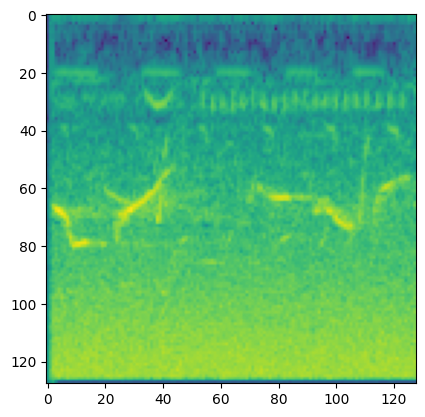

In [29]:
import torchaudio.compliance.kaldi as ta_kaldi
import torchaudio

def preprocess(
    source: torch.Tensor,
    fbank_mean: float = 13.42948,
    fbank_std: float = 3.960432,
    sample_frequency: int = 16000,
) -> torch.Tensor:
    fbanks = []
    for waveform in source:
        waveform = waveform.unsqueeze(0) * 2**15
        fbank = ta_kaldi.fbank(
            waveform,
            num_mel_bins=128,
            sample_frequency=sample_frequency,
            frame_length=25,
            frame_shift=10,
        )
        fbanks.append(fbank)
    fbank = torch.stack(fbanks, dim=0)
    fbank = (fbank - fbank_mean) / (2 * fbank_std)
    return fbank

audio_path = df.filepath.values[0]
wav = torchaudio.load(audio_path)[0]
res = preprocess(wav, sample_frequency=32000)
plt.imshow(res[0].transpose(1, 0)[:128, :128].cpu().numpy())

We can see that the spectrogram has a richer and dicriminative features. However, in order to further improve the quality of audio features, we obtained the first and second derivatives in the column direction of mfcc, so as to obtain the difference information in time dimension. Finally, a matrix with channel number of 3 was formed with the original mfcc, making it similar to the traditional rgb image. We can see that the final features have good discrimination

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'stack MFCC, 1-order MFCC, 2-order MFCC')

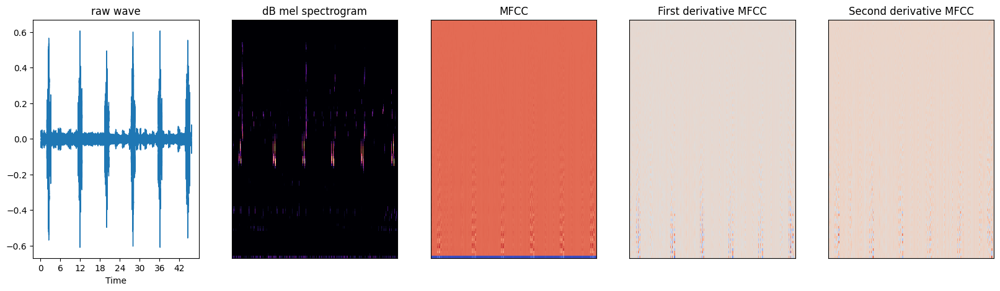

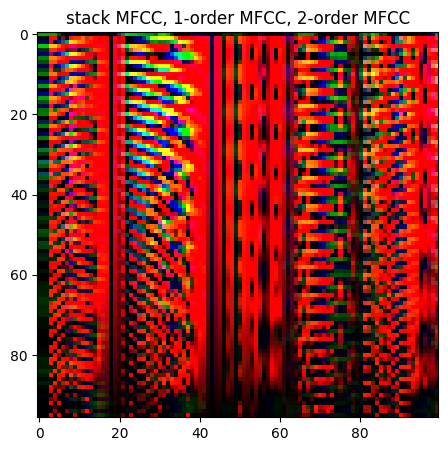

In [7]:
file_path = df.filepath.values[0]
y, sr = librosa.load(file_path)
spec = librosa.core.amplitude_to_db(librosa.feature.melspectrogram(y=y, sr=16000, n_fft=512, hop_length=256, n_mels=96))
mfcc = librosa.feature.mfcc(S=spec, n_mfcc=96)
mfcc_d = librosa.feature.delta(mfcc)
mfcc_dd = librosa.feature.delta(mfcc, order=2)
mfcc_stack = np.stack([mfcc, mfcc_d, mfcc_dd])

plt.figure(figsize=(20, 5))
plt.subplot(1, 5, 1)
plt.title('raw wave')
librosa.display.waveshow(y)
plt.subplot(1, 5, 2)
plt.title('dB mel spectrogram')
librosa.display.specshow(spec)
plt.subplot(1, 5, 3)
plt.title('MFCC')
librosa.display.specshow(mfcc)
plt.subplot(1, 5, 4)
plt.title("First derivative MFCC")
librosa.display.specshow(mfcc_d)
plt.subplot(1, 5, 5)
plt.title("Second derivative MFCC")
librosa.display.specshow(mfcc_dd)

plt.figure(figsize=(20, 5))
plt.imshow(mfcc_stack.transpose(1, 2, 0)[:, :100, :])
plt.title("stack MFCC, 1-order MFCC, 2-order MFCC")
# librosa.display.specshow(mfcc_stack)

### Data Augmentation

We show multiple augmentation methods, such as random resized crop, polarity inversion, add noise, gain, high low pass, delay, pitchshift and reverb. These methods are implemented by torchaudio_augmentations. We show the augmention audio in the following figure: 

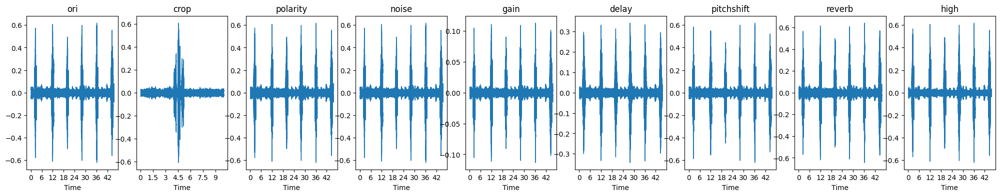

In [9]:
from torchaudio_augmentations import *
import librosa.display as lid
import torchaudio
def audio_augmentation(audio_data : torch.Tensor, sr: int, 
                       num_augmented_sampels=4,
                       num_samples=16000,
                       polarity_p=0.8, 
                       min_snr=0.001, 
                       max_snr=0.005, 
                       noise_p=0.3, 
                       gain_p=0.2, 
                       delay_p=0.5, 
                       shift_p=0.4, 
                       reverb_p=0.3):
    if num_samples>max(audio_data.shape):
        num_samples = max(audio_data.shape)
    
    transforms = [
                RandomResizedCrop(n_samples=num_samples),
                RandomApply([PolarityInversion()], p=polarity_p),
                RandomApply([Noise(min_snr=min_snr, max_snr=max_snr)], p=noise_p),
                RandomApply([Gain()], p=gain_p),
                HighLowPass(sample_rate=sr), # this augmentation will always be applied in this aumgentation chain!
                RandomApply([Delay(sample_rate=sr)], p=delay_p),
                RandomApply([PitchShift(
                    n_samples=num_samples,
                    sample_rate=sr
                )], p=shift_p),
                RandomApply([Reverb(sample_rate=sr)], p=reverb_p)]   
    transforms = ComposeMany(transforms=transforms, num_augmented_samples=num_augmented_sampels)
    audio_aug = transforms(audio_data)
    return audio_aug

audio_path = df.filepath.values[0]
wav, sr = torchaudio.load(audio_path)
wav_resize = RandomResizedCrop(n_samples=CFG.sample_rate * CFG.time_length)(wav)
wav_polar = PolarityInversion()(wav)
wav_noise = Noise()(wav)
wav_gain = Gain()(wav)
wav_delay = Delay(sample_rate=32000)(wav)
wav_pitchshift = PitchShift(n_samples=CFG.sample_rate * CFG.time_length, sample_rate=32000)(wav)
wav_reverb = Reverb(sample_rate=32000)(wav)
wav_high = HighLowPass(sample_rate=sr)(wav)
fig, axs = plt.subplots(1, 9, figsize=(25, 4))
lid.waveshow(wav.numpy(), sr=sr, ax=axs[0])
axs[0].set_title('ori')
lid.waveshow(wav_resize.numpy(), sr=sr, ax=axs[1])
axs[1].set_title('crop')
lid.waveshow(wav_polar.numpy(), sr=sr, ax=axs[2])
axs[2].set_title('polarity')
lid.waveshow(wav_noise.numpy(), sr=sr, ax=axs[3])
axs[3].set_title('noise')
lid.waveshow(wav_gain.numpy(), sr=sr, ax=axs[4])
axs[4].set_title('gain')
lid.waveshow(wav_delay.numpy(), sr=sr, ax=axs[5])
axs[5].set_title('delay')
lid.waveshow(wav_pitchshift.numpy(), sr=sr, ax=axs[6])
axs[6].set_title('pitchshift')
lid.waveshow(wav_reverb.numpy(), sr=sr, ax=axs[7])
axs[7].set_title('reverb')
lid.waveshow(wav_high.numpy(), sr=sr, ax=axs[8])
axs[8].set_title('high')
plt.show()

we present the original audio and noise audio:


In [30]:
ipd.Audio(wav, rate=CFG.sample_rate)
# import soundfile as sf

# sf.write('oriwav.wav', wav.squeeze().numpy(), samplerate=sr)

In [31]:
ipd.Audio(wav_noise, rate=CFG.sample_rate)

# import soundfile as sf

# sf.write('noisewav.wav', wav_noise.squeeze().numpy(), samplerate=sr, format='ogg', subtype='vorbis')

### Optimization Objective

Through count the sample number in each class, we know that there exits the classic "Long Tail" problem. 

<AxesSubplot: >

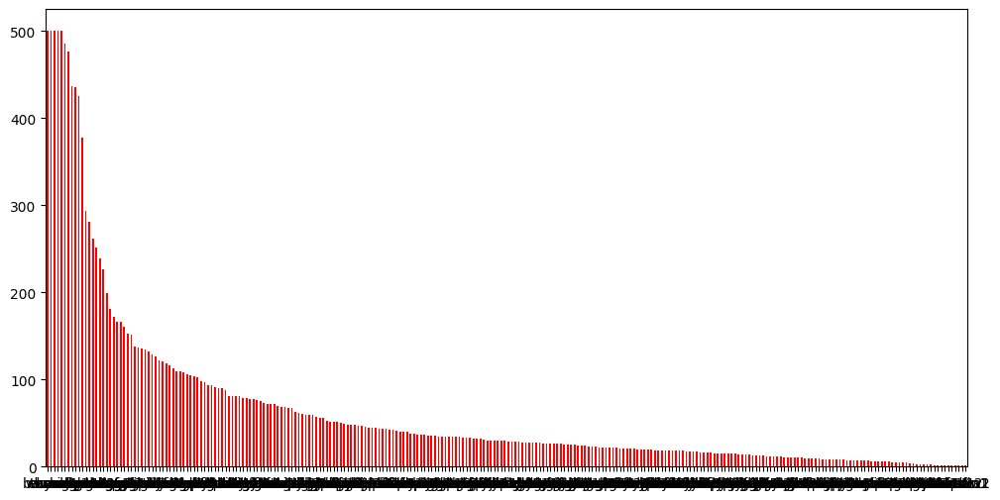

In [32]:
fig, ax = plt.subplots(1, 1, figsize=(12, 6))
ax.set_xticks([])
df.primary_label.value_counts()[:].plot.bar(color='red', label='w/o upsample')


Therefore, in addition to the traditional loss fucntion BCE and CCE, we also use focal loss which has a potential to solve the Long Tail problem.

1. Binary Cross Entropy:

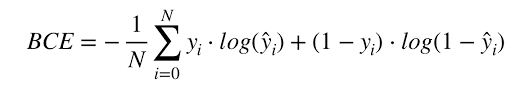


2. Category Cross Entropy:

![figure](https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSjxZbrNsvsxfQ3rfB9Eh8dD6-wmOizbwLuOw&usqp=CAU)

3. Focal Loss:

![figure](https://miro.medium.com/v2/resize:fit:640/format:webp/1*zkWsCJPPtCKzkG1VdZ4atA.png)


### Evaluation and Measurement

For evaluation the model performance in training process, we use multi fold cross evaluation method. Specifically, we use the sklearn.model_selection.StratifiedKFold to split the df into 5 fold. Then, in the training process, we will use different fold to evaluate the model performance. The data split code is shown in the following cell:

In [33]:
# Initialize the StratifiedKFold object with 5 splits and shuffle the data
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=CFG.seed)

# Reset the index of the dataframe
df = df.reset_index(drop=True)

# Create a new column in the dataframe to store the fold number for each row
df["fold"] = -1

# Iterate over the folds and assign the corresponding fold number to each row in the dataframe
for fold, (train_idx, val_idx) in enumerate(skf.split(df, df['primary_label'])):
    df.loc[val_idx, 'fold'] = fold
df.head()

/home/plathzheng/miniconda3/envs/tutorial/lib/python3.8/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename,filepath,target,cv,fold
0,abethr1,[],['song'],4.3906,38.2788,Turdus tephronotus,African Bare-eyed Thrush,Rolf A. de By,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/128013,abethr1/XC128013.ogg,/kaggle/input/birdclef-2023/train_audio/abethr...,0,True,3
1,abethr1,[],['call'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363501,abethr1/XC363501.ogg,/kaggle/input/birdclef-2023/train_audio/abethr...,0,True,3
2,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363502,abethr1/XC363502.ogg,/kaggle/input/birdclef-2023/train_audio/abethr...,0,True,0
3,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/363503,abethr1/XC363503.ogg,/kaggle/input/birdclef-2023/train_audio/abethr...,0,True,4
4,abethr1,[],"['call', 'song']",-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,4.5,https://www.xeno-canto.org/363504,abethr1/XC363504.ogg,/kaggle/input/birdclef-2023/train_audio/abethr...,0,True,1


We choose average precision score and auc to measure the model performance

In [ ]:
def measurement(y_true, y_pred, padding_factor=5):
    if not CFG.loss=='BCE':
        y_true = F.one_hot(torch.from_numpy(y_true), num_classes=CFG.num_classes).numpy()
    # y_true = y_true.numpy()
    num_classes = y_true.shape[1]
    pad_rows = np.array([[1]*num_classes]*padding_factor)
    y_true = np.concatenate([y_true, pad_rows])
    y_pred = np.concatenate([y_pred, pad_rows])
    score = sklearn.metrics.average_precision_score(y_true, y_pred, average='macro',)
    roc_aucs = sklearn.metrics.roc_auc_score(y_true, y_pred, average='macro')
    return score, roc_aucs

### Model Training

In each fold, we will tune the learning rate and batch size. We use optuna to help us do this.

In [ ]:
def objective(trial):
    args.lr = trial.suggest_float("lr", 1e-4, 1e-3, log=True)
    args.batch_size = trial.suggest_int('batch size', 32, 32) if not CFG.debug else 4
    args.fold = trial.suggest_int('split fold', 0, 4)
    CFG.batch_size = args.batch_size
    CFG.lr = args.lr
    
    args.save_dir = os.path.join(experiment_dir, "trial_{}".format(trial.number))
    os.makedirs(args.save_dir, exist_ok=True)
    
    for key, value in trial.params.items():
        print("  {}: {} \n".format(key, value))
    best_metric = main(args)
    
    with open(os.path.join(args.save_dir, "best_metric.txt"), mode='w', encoding='utf-8') as w:
        for key, value in trial.params.items():
            w.writelines("    {}: {} \n".format(key, value))
        w.writelines(str(best_metric))
    return best_metric

#### Train Model by Optuna

In [ ]:
args.experiment_name = 'efficient_visual'
args.model_name = 'efficient'

experiment_dir = os.path.join("experiments", args.experiment_name)
os.makedirs(experiment_dir, exist_ok=False)

study = optuna.create_study(directions=['maximize'])
study.optimize(objective, n_trials=10)
pruned_trials = study.get_trials(deepcopy=False, states=[TrialState.PRUNED])
complete_trials = study.get_trials(deepcopy=False, states=[TrialState.COMPLETE])
print("Study statistics: ")
print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

print("Best trial:")
trial = study.best_trial

print("  Value: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

We train the model in .py files and the the best performance model ckpt can be found [here](https://drive.google.com/file/d/1GpmmXqQDHtBnchjS2o6LRkTAAT3DWQul/view?usp=share_link)

When download this ckpt, we can use it the generate the final submission.

In [ ]:
from transformers import ASTFeatureExtractor
ast_feature_extractor = ASTFeatureExtractor()
config = ASTConfig() 
model = ASTagModel(config=config, train_config=args)

ckpt = torch.load('experiments/ast/trial_0/ast.pth', map_location=device)
model.load_state_dict(ckpt)
model = model.to(device)

def file_load_chunk(audio_path, duration=5, sr=32000):
    raw, sr = librosa.load(audio_path, sr=CFG.sample_rate, mono=True)
    raw = librosa.resample(raw, orig_sr=CFG.sample_rate, target_sr=16000)  # ast can only process the audio with sr=16000
    frame_length = int(duration*16000)
    frame_step = int(duration*16000)
    chunks = librosa.util.frame(raw, frame_length=frame_length, hop_length=frame_step, axis=0)
    return chunks


model.eval()
pred_stack = torch.randn(size=(1, CFG.num_classes)).to(device)
ids = []
for filepath in tqdm(test_df.filepath.tolist()):
    filename = filepath.split('/')[-1].replace('.ogg','')
    chunks = file_load_chunk(filepath)
    
    inputs = ast_feature_extractor(chunks.tolist(), sampling_rate=16000, return_tesnors='pt')
    inputs = inputs['input_values']
    inputs = np.stack(inputs)
    inputs = torch.from_numpy(inputs)
    if len(inputs.shape)==2:
        inputs = inputs.unsqueeze(0)
    inputs = inputs.to(device)
    with torch.no_grad():
        prob = model(inputs)
    pred_stack = torch.cat([pred_stack, prob], dim=0)
    ids += [f'{filename}_{(frame_id+1)*5}' for frame_id in range(len(chunks))]
pred_stack = pred_stack[1:]
preds = pred_stack.detach().cpu().numpy()

#### Parameter Importance

We can use optuna.visualzation.plot_param_importances to show the importances of parameters in the tuning process.

The parameter importance of AST:

![AST](Imgs/ast_import.png)

The parameter importance of EfficientNet:

![eff](Imgs/eff_import.png)


We can see that the most important parameter is learning rate, and the fold of the validation set also has a certain impact on the performance of the final model, so the final model will choose the one with the best performance from the multi-folds.


#### Optimization history

We can use optuna.visualization.plot_optimization_history to show the optimization history. In order to improve the training speed, we set the training epoch to be 10, so the result is only for presentation, and there is a little difference with the final training result.

The optimization history of AST:

![AST](Imgs/ast_history.png)

The optimization history of EfficientNet:

![eff](Imgs/eff_history.png)

### Experiment analyze

#### OverView

|                         | BEATs | Musicnn | EfficientNet | AST  |
| :---------------------: | :---: | :-----: | :----------: | :--: |
| Average Precision Score | 0.62  |  0.48   |     0.66     | 0.87 |
|           AUC           | 0.87  |  0.75   |     0.92     | 0.98 |


We can see that the AST model has the best performance, followed by EfficientNet, while Musicnn and BEATs show poor performance. Because AST is pre-trained on a large-scale data set, and it uses a structure similar to ViT to extract discriminable features from spectrogram, it still has excellent performance despite using bird audio with a lot of noise. The efficientnet, however, enables the extraction of features of multiple scales using convolution and the discovery of subtle differences in the spectrogram, thus achieving certain recognition accuracy. However, we can see that the AUC and APS of the model are quite different, which may require us to adjust the classification threshold in the subsequent training, so as to further improve the performance of the model.

#### Error Analyze

From, the above training part, we know that AST and Efficientnet achieve a better performance than that of other models. In the following part, we will focus on these two models and analyze why they have a better performance and whether there is room for improvement.

In [6]:
config = ASTConfig() 
ast_model = ASTagModel(config=config, train_config=args)
ckpt = torch.load('experiments/ast_9layer/trial_1/ast.pth', map_location=device)
ast_model.load_state_dict(state_dict=ckpt)
ast_model = ast_model.to(device)
ast_model.eval()


eff_model = Efficient(args)
eff_model = torch.load('experiments/efficient_save/trial_0/efficient.pth', map_location=device)
eff_model = eff_model.to(device)
eff_model.eval()
# ckpt = torch.load('experiments/efficient_save/trial_0/efficient.pth')
# efficient_model.load_state_dict(state_dict=ckpt)

Loaded pretrained weights for efficientnet-b0


Efficient(
  (spec_bn): BatchNorm2d(3, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layers): ModuleList(
    (0): Conv_V(
      (conv): Conv2d(3, 204, kernel_size=(67, 7), stride=(1, 1), padding=(0, 3))
      (bn): BatchNorm2d(204, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Conv_V(
      (conv): Conv2d(3, 204, kernel_size=(38, 7), stride=(1, 1), padding=(0, 3))
      (bn): BatchNorm2d(204, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (2): Conv_H(
      (conv): Conv1d(3, 51, kernel_size=(129,), stride=(1,), padding=(64,))
      (bn): BatchNorm1d(51, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (3): Conv_H(
      (conv): Conv1d(3, 51, kernel_size=(65,), stride=(1,), padding=(32,))
      (bn): BatchNorm1d(51, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (4): Conv_

In [7]:
class ASTDatasetShow(ASTDataset):
    def __init__(self, df, fold=4, mode='train', transform=None):
        super().__init__(df, fold, mode, transform)
    
    def __getitem__(self, idx):
        audio, label = super().__getitem__(idx)
        audio_path = self.train_paths[idx] if self.mode=='train' else self.valid_paths[idx]
        return audio, label, audio_path

class MusicnnDatasetShow(MusicnnDataset):
    def __init__(self, df, fold=4, mode='train', transform=None):
        super().__init__(df, fold, mode, transform)
    
    def __getitem__(self, idx):
        audio, label = super().__getitem__(idx)
        audio_path = self.train_paths[idx] if self.mode=='train' else self.valid_paths[idx]
        return audio, label, audio_path
dataset_eval_ast = ASTDatasetShow(df, fold=4, mode='eval')
loader_ast = DataLoader(dataset_eval_ast, batch_size=1, shuffle=False, num_workers=0)
dataset_eval = MusicnnDatasetShow(df, fold=2, mode='eval')
ast_valid_paths = dataset_eval_ast.valid_paths
ast_valid_paths = [path.replace('.pt', '_mfcc.npy') for path in ast_valid_paths]
dataset_eval.valid_paths = ast_valid_paths
loader_eff = DataLoaderX(dataset_eval, batch_size=1, shuffle=False, num_workers=0)

pred_ast = []
pred_eff = []
labels = []
paths = []
cnt = 10

for index, (audio, label, path) in enumerate(loader_ast):
    audio = audio.to(device)
    with torch.no_grad():
        pred = ast_model(audio)
        pred_ast.append(pred.cpu().numpy())
        labels.append(label)
        paths.append(path)
    if index>10:
        break

for index, (audio, label, path) in enumerate(loader_eff):
    audio = audio.to(device)
    with torch.no_grad():
        pred = eff_model(audio)
        pred_eff.append(pred.cpu().numpy())
    if index>10:
        break

predast = [CFG.label2name[np.argmax(pred)] for pred in pred_ast]
predeff = [CFG.label2name[np.argmax(pred)] for pred in pred_eff]
label = [path[0].split('/')[-2] for path in paths]
print("AST pred: ", predast)
print("EFF pred: ", predeff)
print("GT  Pred: ", label)

AST pred:  ['woosan', 'ratcis1', 'abethr1', 'abhori1', 'abhori1', 'abhori1', 'wbrcha2', 'abhori1', 'abhori1', 'abhori1', 'abhori1', 'abhori1']
EFF pred:  ['woosan', 'abethr1', 'comsan', 'abhori1', 'scthon1', 'hoopoe', 'abhori1', 'abhori1', 'comsan', 'abhori1', 'abhori1', 'abhori1']
GT  Pred:  ['abethr1', 'abethr1', 'abethr1', 'abhori1', 'abhori1', 'abhori1', 'abhori1', 'abhori1', 'abhori1', 'abhori1', 'abhori1', 'abhori1']


We compare the prediction results of the ast model and the efficientnet model in the validation set. 

We can see that the ast model has a better performance than the efficientnet model.

We'll look in depth where the model's predictions are wrong.

We respectively show the samples where both models predict wrong, and the samples where a single model predicts wrong.

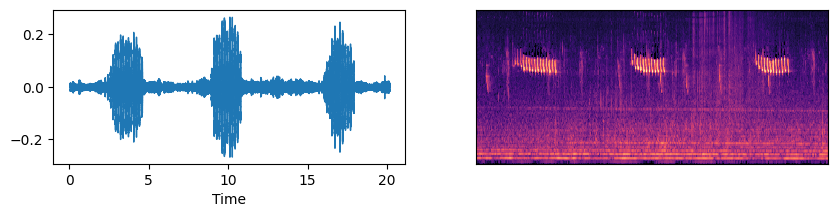

In [26]:
common_error_path = paths[0][0]
wav, sr = librosa.load(common_error_path.replace('.pt', '.ogg'))
spec = librosa.feature.melspectrogram(y=wav, sr=CFG.sample_rate, 
                                n_mels=CFG.img_size[0],
                                n_fft=CFG.nfft,
                                hop_length=CFG.hop_length,
                                fmax=CFG.fmax,
                                fmin=CFG.fmin,
                                )
spec = librosa.power_to_db(spec, ref=np.max)
fig, axs = plt.subplots(1, 2, figsize=(10, 2))
lid.waveshow(wav, sr=CFG.sample_rate, ax=axs[0])
lid.specshow(spec, sr=CFG.sample_rate, ax=axs[1])
display(ipd.Audio(wav, rate=CFG.sample_rate))

sf.write('commonwrong.wav', wav, samplerate=CFG.sample_rate)

We show the original audio wav and the corresponding spectrogram. The original audio is also presented. From the original audio, we can hear that there is a loud noise. The bird's calls have certain regularity. And there may be other bird calls in the background as well which makes it difficult for the model to identify the right bird.

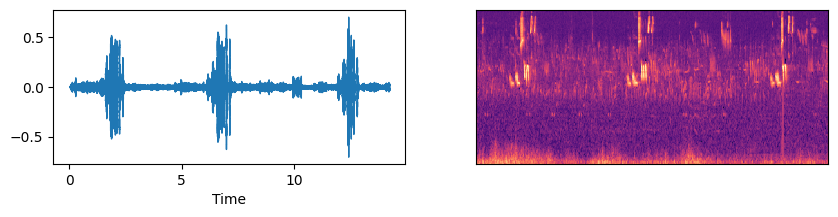

In [27]:
ast_error_path = paths[1][0]
wav, sr = librosa.load(ast_error_path.replace('.pt', '.ogg'))
spec = librosa.feature.melspectrogram(y=wav, sr=CFG.sample_rate, 
                                n_mels=CFG.img_size[0],
                                n_fft=CFG.nfft,
                                hop_length=CFG.hop_length,
                                fmax=CFG.fmax,
                                fmin=CFG.fmin,
                                )
spec = librosa.power_to_db(spec, ref=np.max)
fig, axs = plt.subplots(1, 2, figsize=(10, 2))
lid.waveshow(wav, sr=CFG.sample_rate, ax=axs[0])
lid.specshow(spec, sr=CFG.sample_rate, ax=axs[1])
display(ipd.Audio(wav, rate=CFG.sample_rate))

sf.write('astwrong.wav', wav, samplerate=CFG.sample_rate)

For this sample, AST model has a correct prediction, while EfficientNet has a wrong prediction. In this audio clip, we also heard a variety of bird calls, but the one we needed to identify was the loudest, and the AST model predicted the right bird, indicating that the ast model has the potential to make correct predictions under loud noise conditions.

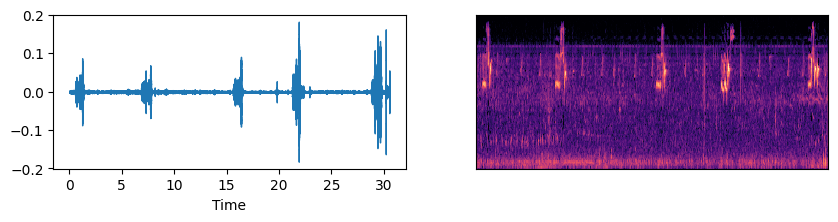

In [28]:
eff_error_path = paths[2][0]
wav, sr = librosa.load(eff_error_path.replace('.pt', '.ogg'))
spec = librosa.feature.melspectrogram(y=wav, sr=CFG.sample_rate, 
                                n_mels=CFG.img_size[0],
                                n_fft=CFG.nfft,
                                hop_length=CFG.hop_length,
                                fmax=CFG.fmax,
                                fmin=CFG.fmin,
                                )
spec = librosa.power_to_db(spec, ref=np.max)
fig, axs = plt.subplots(1, 2, figsize=(10, 2))
lid.waveshow(wav, sr=CFG.sample_rate, ax=axs[0])
lid.specshow(spec, sr=CFG.sample_rate, ax=axs[1])
display(ipd.Audio(wav, rate=CFG.sample_rate))

sf.write('effwrong.wav', wav, samplerate=CFG.sample_rate)

The noise in this segment is minimal compared with the previous two segments, but the efficientnet is also incorrectly predicted, indicating that the robustness of the efficientnet differs significantly from the ast model

 At the same time, we can see that the audio of birds is quite different from the traditional human audio. Their calls have certain regularity, but the difference between different birds' calls may be smaller, and it is difficult to reflect such small differences in the extracted features.

#### Feature Visualization

We use TSNE to visualize the hidde state in the last layer of vision transformer.

In [8]:
class ASTVisual(ASTagModel):
    def __init__(self, config, *inputs, **kwargs):
        super().__init__(config, *inputs, **kwargs)
    
    def forward(self, input_values):
        outputs = self.audio_spectrogram_transformer(input_values)
        hidden_states = outputs.last_hidden_state
        pool_output = torch.mean(hidden_states, dim=1)
        return pool_output

config = ASTConfig() 
ast_model = ASTVisual(config=config, train_config=args)
ckpt = torch.load('experiments/ast_9layer/trial_1/ast.pth', map_location=device)
ast_model.load_state_dict(state_dict=ckpt)
ast_model = ast_model.to(device)
ast_model.eval()

ASTVisual(
  (audio_spectrogram_transformer): ASTModel(
    (embeddings): ASTEmbeddings(
      (patch_embeddings): ASTPatchEmbeddings(
        (projection): Conv2d(1, 768, kernel_size=(16, 16), stride=(10, 10))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ASTEncoder(
      (layer): ModuleList(
        (0): ASTLayer(
          (attention): ASTAttention(
            (attention): ASTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ASTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ASTIntermediate(
            (dense): Linear(in_features

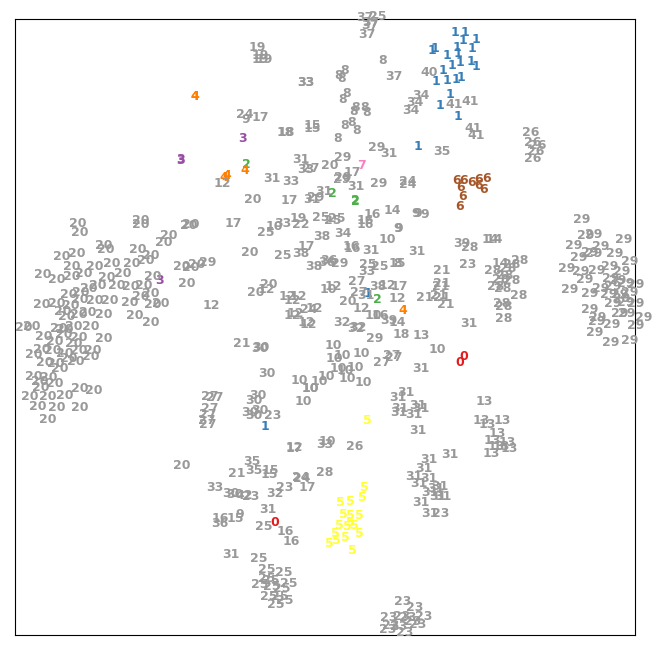

In [19]:
def tsne_visualize(X,y):
    x_min, x_max = X.min(0), X.max(0)
    X_norm = (X - x_min) / (x_max - x_min)  # 归一化
    plt.figure(figsize=(8, 8))
    for i in range(X_norm.shape[0]):
        plt.text(X_norm[i, 0], X_norm[i, 1], str(y[i]), color=plt.cm.Set1(y[i]),
                 fontdict={'weight': 'bold', 'size': 9})
    plt.xticks([])
    plt.yticks([])
    plt.show()

from sklearn.manifold import TSNE


features = []
labels = []
for index, (audio, label, path) in enumerate(loader_ast):
    audio = audio.to(device)
    with torch.no_grad():
        feature = ast_model(audio)
        features.append(feature.detach().cpu().numpy())
    labels.append(torch.argmax(label).item())
    if index>500:
        break

features = np.stack(features).squeeze()
X_embedded = TSNE(n_components=2, init='pca').fit_transform(features)

tsne_visualize(X_embedded, labels)



We can see that, when we map these features to the two-dimensional plane, these features have obvious separability

### Conclusion

In the deep learning section, we use several traditional models and several new models, both using models based on the convolutional structure and models based on the transformer structure. By applying these models to the bird identification task, we find that the performance of the model based on the transformer structure is optimal, but the convolutional model also has great potential. Although the model based on transformer structure has better performance, it has a larger number of parameters and slower inference speed, while the model based on convolutional structure has a small number of parameters, but it can achieve satisfactory performance. In order to combine the advantages of the two, we believe that in the subsequent work, we should try to carry out distillation of the model based on transformer structural model, and transfer the features learned into a model based on convolution, so as to achieve high performance of small models.